##  Dataset Overview:
The dataset, sourced from metacritic.com, encompasses movie-related information with 11,364 entries. Key attributes include:

- **url:** URL of the movie
- **title:** Movie title
- **studio:** Film production studio
- **rating:** Movie rating (e.g., age limit: pg-13)
- **runtime:** Duration of the movie (in minutes)
- **cast:** Cast members
- **director:** Film director
- **genre:** Movie genre
- **summary:** Brief movie description
- **awards:** Received awards information
- **metascore:** Critic score ranging from 0 to 100
- **userscore:** User score ranging from 0 to 10
- **RelDate:** Release date of the movie

The dataset exhibits variations in data completeness. Data types include object (text), float64, and int64.

##  The Scope of the Research:
##  Research Question Supervised Learning:
"How can a movie studio utilize the power of data-driven insights, using Supervised Learning (Random Forest and Neural Network) models, to refine its film production and marketing strategies, ultimately maximizing the likelihood of a movie receiving awards and thereby elevating its financial success, industry recognition, and reputation?"

Subquestions for Supervised Learning (Random Forest and Neural Network Models):
1. Which features (e.g., rating, runtime, genre, userscore, metastore, release date, etc.) have the most significant impact on the likelihood of a movie receiving an award?
2. To what extent can the best-performing model, whether it be the random forest or neural network, accurately predict the likelihood of a movie receiving an award based on its features, and how well does it generalize to new data?
3. How can explainability methods such as SHAP, Counterfactuals, or ALE be utilized to gain insights into the key factors influencing award reception in the movie industry using the best-performing model?
4. Based on the results obtained from model evaluation and explainability analysis, what actionable insights can be drawn regarding the effectiveness of the selected machine learning models in guiding decision-making for film production and marketing strategies to maximize the likelihood of a movie receiving an award?


##  Research Question Unsupervised Learning:
"How can a movie studio leverage unsupervised clustering models to better understand audience preferences, optimize marketing strategies, and identify potential trends that increase the likelihood of a movie receiving awards and thereby elevating its financial success, industry recognition, and reputation?"

Subquestions for Unsupervised Learning (Clustering Model):
1. Which features significantly contribute to the formation of distinct movie clusters, and to what extent do these clusters align with movies that have received awards in the past?
2. After finding the optimal clustering model, how can the resulting clusters be interpreted by plotting the original features for each cluster, and what conclusions can be drawn regarding what those clusters represent in the context of increasing the likelihood of a movie receiving an award?
3. Can the clustering model reveal trends or patterns in the data that could inform directorial choices for upcoming movies, aligning with the goal of achieving awards and ultimately enhancing the studio's financial success and reputation in the film industry?


##  Import Libraries

In [90]:
import shap
import datetime
import pickle
import random

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy import stats

from sklearn.preprocessing import MinMaxScaler
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from keras.wrappers.scikit_learn import KerasRegressor
from keras.optimizers import Adam, RMSprop
from keras.layers import Dropout


##  Load Dataset

In [2]:
# Reading the data
df = pd.read_csv(r"metaClean43.csv")
print('Original length of dataframe:', len(df))
df

Original length of dataframe: 11364


,url,title,studio,rating,runtime,cast,director,genre,summary,awards,metascore,userscore,RelDate
0,https://www.metacritic.com/movie/!women-art-re...,!Women Art Revolution,Hotwire Productions,| Not Rated,83.0,NaN,Lynn Hershman-Leeson,Documentary,NaN,NaN,70,NaN,6/1/2011
1,https://www.metacritic.com/movie/10-cloverfiel...,10 Cloverfield Lane,Paramount Pictures,| PG-13,104.0,"John Gallagher Jr.,John Goodman,Mary Elizabeth...",Dan Trachtenberg,"Action,Sci-Fi,Drama,Mystery,Thriller,Horror","Waking up from a car accident, a young woman (...","#18MostDiscussedMovieof2016 , #1MostSharedMovi...",76,7.7,3/11/2016
2,https://www.metacritic.com/movie/10-items-or-less,10 Items or Less,Click Star,| R,82.0,"Jonah Hill,Morgan Freeman,Paz Vega",Brad Silberling,"Drama,Comedy,Romance",While researching a role as a supermarket mana...,NaN,54,5.8,12/1/2006
3,https://www.metacritic.com/movie/10-years,10 Years,Anchor Bay Entertainment,| R,100.0,"Channing Tatum,Chris Pratt,Jenna Dewan",Jamie Linden,"Drama,Comedy,Romance",NaN,NaN,61,6.9,9/14/2012
4,https://www.metacritic.com/movie/100-bloody-acres,100 Bloody Acres,Music Box Films,| Not Rated,91.0,NaN,Cameron Cairnes,"Horror,Comedy",Reg and Lindsay run an organic fertilizer busi...,NaN,63,7.5,6/28/2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11359,https://www.metacritic.com/movie/zoolander-2,Zoolander 2,Paramount Pictures,| PG-13,102.0,"Ben Stiller,Kristen Wiig,Owen Wilson,PenÃ©lope...",Ben Stiller,Comedy,Derek (Ben Stiller) and Hansel (Owen Wilson) a...,"#87MostDiscussedMovieof2016 , #80MostSharedMov...",34,4.1,2/12/2016
11360,https://www.metacritic.com/movie/zoom,Zoom,Columbia Pictures,| PG,83.0,"Chevy Chase,Courteney Cox,Tim Allen",Peter Hewitt,"Action,Adventure,Sci-Fi,Family",A former superhero (Allen) is called back into...,NaN,26,4.4,8/11/2006
11361,https://www.metacritic.com/movie/zoom-2016,Zoom,Screen Media Films,| Not Rated,96.0,NaN,Pedro Morelli,"Drama,Comedy,Animation",A multi-dimensional interface between a comic ...,NaN,55,5.7,9/2/2016
11362,https://www.metacritic.com/movie/zootopia,Zootopia,Walt Disney Studios Motion Pictures,| PG,108.0,NaN,Byron Howard,"Action,Adventure,Comedy,Crime,Animation,Family",NaN,"#80BestMovieof2016 , #11MostDiscussedMovieof20...",78,8.6,3/4/2016


##  Supervised learning problem

1. Exploratory data analysis and data cleaning of the dataset: Typically you will use here the techniques you have already learned in statistics and database management, such as correlation analysis and descriptive statistics, distribution visualizations, outlier removal, missing values imputation, ...
2. Feature engineering: To train your model, you will need to create a feature dataset from the clean data. You might have to perform some or all of the following: feature scaling/normalization, feature selection based on the EDA results, categorical variable encoding, feature transformation and new feature creation.
3. Datasets generation: Generate train, validation, and test datasets as explained during the lectures and labs.
4. Model fitting: Perform fitting and grid-search hyperparameter tuning on the train and validation datasets to find the best parameters for both random forest and neural network on the chosen target. You should also produce plots to investigate how the loss function of the neural network evolves over the epochs on the train and validation datasets. You should do this to identify the best number of training epochs for the set of hyperparameters you identified.
5. Model evaluation: Evaluate the fit of each model on the test set using an appropriate performance metric that is suitable for the specific problem. Here you should also consider whether the chosen metric is easy to communicate to non-technical stakeholders. You might want to consider multiple metrics for this purpose. You should also produce some plots investigating in more detail the models’ accuracy on the test set: for instance, actual vs. predicted plot, confusion matrix.
6. Model selection: Compare the performance of the neural network model and random forest model: which one is better?
7. Explainability: Explain the best performing model’s predictions based on one of the following methods: (i) SHAP (ii) Counterfactuals (iii) ALE. Also make proper conclusions on the results you get.
8. Bonus: can you fit other models to the data (linear/logistic regression, KNN, XGboost)? How do they compare to the RF and neural network?
9. Bonus: can you fit the random forest model using 5-fold cross-validation to find the best hyperparameters? Even better if you can implement the k-fold cross-validation calculation yourself rather than relying on the sklearn library.

##  1. EDA

In [3]:
# Display summary information about the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11364 entries, 0 to 11363
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   url        11364 non-null  object 
 1   title      11364 non-null  object 
 2   studio     11014 non-null  object 
 3   rating     10297 non-null  object 
 4   runtime    11109 non-null  float64
 5   cast       7662 non-null   object 
 6   director   11350 non-null  object 
 7   genre      11344 non-null  object 
 8   summary    5467 non-null   object 
 9   awards     4387 non-null   object 
 10  metascore  11364 non-null  int64  
 11  userscore  9259 non-null   float64
 12  RelDate    11364 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 1.1+ MB


In [4]:
# Checking Nans and if required removing them
print('Printing total number of NaNs in the dataframe,', df.isnull().sum().sum())

Printing total number of NaNs in the dataframe, 20387


In [5]:
# Check where are the most missing values to get a better sense of the situation
df.isnull().sum().sort_values(ascending = False)

awards       6977
summary      5897
cast         3702
userscore    2105
rating       1067
studio        350
runtime       255
genre          20
director       14
url             0
title           0
metascore       0
RelDate         0
dtype: int64

In [6]:
# Find the % of the missing values
df.isnull().sum().sort_values(ascending = False)/len(df)*100

awards       61.395635
summary      51.891939
cast         32.576558
userscore    18.523407
rating        9.389300
studio        3.079901
runtime       2.243928
genre         0.175994
director      0.123196
url           0.000000
title         0.000000
metascore     0.000000
RelDate       0.000000
dtype: float64

### Missing values

The awards column has 61.4% missing values. Since NaN entries (might) represent movies that have not received any awards, and considering that we plan to drop this column later when converting it to categorical data, no immediate action is required for these missing values.

The summary column shows a significant portion of missing data at 51.9%. This column might not be critical for analysis, as it just shows the summary about the movie.

cast has 32.6% missing values. Depending on the role of cast information in the model, we might opt to exclude these entries.

The userscore and rating columns, with 18.5% and 9.4% missing values respectively, are critical metrics for assessing a movie's success. The absence of these values presents a challenge. While K Nearest Neighbors could be used for imputation, this approach may introduce bias or inaccuracies. Considering the importance of these metrics, a conservative approach would be to drop rows where either of these values is missing. This ensures the integrity of the model's output and still leaves us with a robust dataset for analysis.

Missing genre and runtime data are minimal (0.18% and 2.24% respectively). Given the low percentage, these rows can be removed without significantly affecting the dataset's diversity.

director data is missing in 0.12% of cases. While this information is usually important, acquiring the missing director names may not be feasible within the scope of this case study. Since the missing percentage is relatively small, these rows can be safely discarded with minimal impact on the dataset's breadth.



In [7]:
# Drop nans in the below mentioned columns
df.dropna(subset=['rating'], inplace=True)
df.dropna(subset=['genre'], inplace=True)
df.dropna(subset=['runtime'], inplace=True)
df.dropna(subset=['director'], inplace=True)

In [8]:
# Create a list of unique directors from the 'director' column, as there are cases where multiple directors are listed for a single entry.
directors_overlap = df['director'].str.split(',')
unique_directors = []
for director in directors_overlap:
    try:
        unique_directors.extend(director)
    except:
        continue
unique_directors = pd.Series(list(set(unique_directors)))
unique_directors


0           Tylor Norwood
1            Ramez Silyan
2       Kristopher Belman
3           Till Schauder
4           Robert Parigi
              ...        
5459            John Rice
5460         Lynn Shelton
5461      Jacob Kornbluth
5462     Ãgnes Hranitzky
5463          Adam Irving
Length: 5464, dtype: object

There are 5464 unique directors in the dataset (there might be an overlap because of encoding problems. For all intents and purposes there are about 5000 directors here).

In [9]:
# Counting the occurrences of each director's name
director_counts = df['director'].value_counts()


# Creating a new DataFrame with director names and their respective movie counts
director_movie_counts = pd.DataFrame({'Director': director_counts.index, 'Movie_Count': director_counts.values})

# Displaying the resulting DataFrame
director_movie_counts.sort_values(by='Movie_Count')

,Director,Movie_Count
2731,Michael Ritchie,1
3646,Rob Pritts,1
3645,Colette Burson,1
3644,Anthony Scott Burns,1
3643,Ant Timpson,1
...,...,...
4,Spike Lee,18
3,Woody Allen,18
2,Michael Winterbottom,20
1,Tyler Perry,21


In [10]:
# Displaying the directors who directed more than 5 movies overall:
director_movie_counts.sort_values(by='Movie_Count')[director_movie_counts['Movie_Count'] > 5]

Boolean Series key will be reindexed to match DataFrame index.


,Director,Movie_Count
190,Tate Taylor,6
191,Asghar Farhadi,6
192,Eytan Fox,6
193,John Sayles,6
194,Davis Guggenheim,6
...,...,...
4,Spike Lee,18
3,Woody Allen,18
2,Michael Winterbottom,20
1,Tyler Perry,21


In [11]:
# How many such directors are there?
len(director_movie_counts.sort_values(by='Movie_Count')[director_movie_counts['Movie_Count'] > 5])

Boolean Series key will be reindexed to match DataFrame index.


257

In [12]:
# That adds up to this many movies that were directed by directors who directed more than 5 movies in the dataset
sum(director_movie_counts.sort_values(by='Movie_Count')[director_movie_counts['Movie_Count'] > 5]['Movie_Count'])

Boolean Series key will be reindexed to match DataFrame index.


2033

This exploratory step tells me that there are 257 directors that have all together directed 2033 movies.
I am going to keep only these rows in the dataframe, and drop everything else. 

Movie studios usually decide who should direct a movie, and this is one of the most crucial decisions these studios make overall, and this decision will definitely affect the awards won overall.

In [13]:
# Filter directors with more than 5 movies from sorted director_movie_counts DataFrame by Movie_Count.
famous_directors = director_movie_counts.sort_values(by='Movie_Count')[director_movie_counts['Movie_Count'] > 5]['Director']

Boolean Series key will be reindexed to match DataFrame index.


In [14]:
# Filter the DataFrame to only include rows where the 'director' is in the list of 'famous_directors'
df = df[df['director'].isin(famous_directors)]

The summary and cast columns are not taken into consideration in this study as they would require powerful AI techniques, such as NLP (perhaps Sentiment Analysis) to successfully use them.

I am also removing studio, as the studio cannot decide what studio it must become to maximise awards.

In [15]:
# Drop the following columns, see explanation above
df.drop(columns=['summary', 'cast', 'studio'], inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [16]:
# Find the % of missing values
df.isnull().sum().sort_values(ascending = False)/len(df)*100

awards       37.924250
userscore     4.033448
url           0.000000
title         0.000000
rating        0.000000
runtime       0.000000
director      0.000000
genre         0.000000
metascore     0.000000
RelDate       0.000000
dtype: float64

As said above, missing awards and userscore is of no concern here - it will be dealt with at a later step, both will be removed.

In [17]:
df

,url,title,rating,runtime,director,genre,awards,metascore,userscore,RelDate
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,Roland Emmerich,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",34,4.6,3/7/2008
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,Baltasar KormÃ¡kur,"Comedy,Romance",NaN,68,5.4,7/25/2001
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,Renny Harlin,"Action,Thriller,Crime",#71MostSharedMovieof2009,38,5.0,3/27/2009
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,Steve McQueen,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",96,8.0,10/18/2013
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,Danny Boyle,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",82,8.1,11/5/2010
...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,Abel Ferrara,"Thriller,War",NaN,61,4.4,11/19/2021
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,James Franco,"Drama,Comedy",NaN,28,4.9,9/20/2019
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,David Fincher,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",78,8.4,3/2/2007
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,Drake Doremus,"Sci-Fi,Romance",NaN,39,6.5,7/20/2018


In [18]:
# Descriptive statistics after missing data handeling
df.describe()

,runtime,metascore,userscore
count,2033.000000,2033.000000,1951.000000
mean,111.935563,59.153960,6.672629
std,21.167203,16.766119,1.303777
min,30.000000,9.000000,1.100000
25%,98.000000,47.000000,5.900000
50%,109.000000,60.000000,6.800000
75%,122.000000,72.000000,7.600000
max,325.000000,100.000000,9.100000


### Distribution

Since the goal is to maximize the number of awards that a movie can win, we are interested in the overall number of awards the movies in the dataset have received. 

Below is a function that splits the column data by the comma delimiter and assigns the length of the list to the row in the dataset.

In [19]:
def count_awards(awards_str):
    # Split the awards string by comma and count the number of awards
    try:
        if not awards_str.strip():  # Check if the string is empty or contains only whitespace
            return 0
        else:
            return len(awards_str.split(','))
    except:
        return 0
        

# Apply the count_awards function to each row in the 'awards' column
df['num_awards'] = df['awards'].apply(count_awards)

NUM_AWARDS = df['num_awards']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [20]:
# Sort the num_awards values
df['num_awards'].sort_values()

8470     0
6683     0
9151     0
10256    0
10253    0
        ..
2839     3
2820     3
2742     3
3118     3
5935     3
Name: num_awards, Length: 2033, dtype: int64

In [21]:
# Distribution of awards
df['num_awards'].value_counts().sort_index()

0    771
1    563
2    522
3    177
Name: num_awards, dtype: int64

As this exploratory step below shows, the slight majority (around 37%) have not received a single award, around a quarter received 1, and a quarter received 2 and 8% received 3.

In [22]:
# Show the distribution of awards in %
df['num_awards'].value_counts().sort_index() / sum(df['num_awards'].value_counts().sort_index()) * 100

0    37.924250
1    27.693064
2    25.676340
3     8.706345
Name: num_awards, dtype: float64

### Exploring title lenght's effect

In [23]:
def count_title_len(title_str):
    # Split the title string by space and count the number of words.
    # A word here is defined as anything separated by a space character.
    if not title_str.strip():  ##  Check if the string is empty or contains only whitespace
        return 0
    else:
        return len(title_str.split(' '))

# Apply the count_awards function to each row in the 'awards' column
df['num_words_title'] = df['title'].apply(count_title_len)

NUM_WORDS = df['num_words_title']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [24]:
# Sort the num_words_title values
df['num_words_title'].sort_values()

5935     1
4315     1
4319     1
4325     1
4348     1
        ..
513     10
9454    11
4872    12
8793    13
4495    17
Name: num_words_title, Length: 2033, dtype: int64

In [25]:
# Count and sort the number of occurrences of each unique word count in the column 'num_words_title'
df['num_words_title'].value_counts().sort_index()

1     435
2     611
3     476
4     243
5     105
6      64
7      43
8      33
9       8
10     11
11      1
12      1
13      1
17      1
Name: num_words_title, dtype: int64

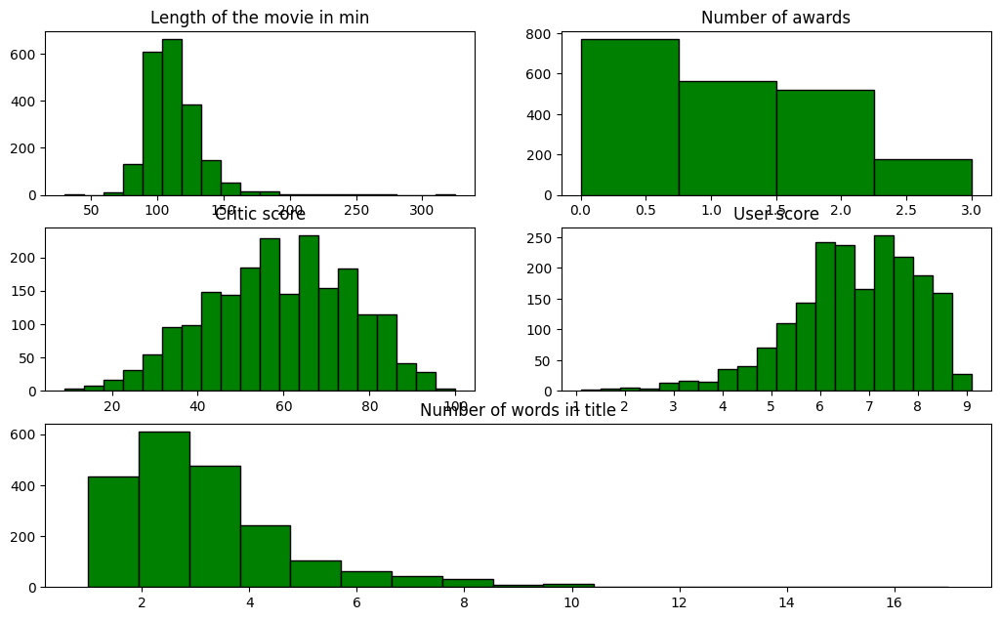

In [26]:
# Let's dive into distributions
gs = gridspec.GridSpec(4,2)
fig = plt.figure(figsize=(12.5, 10), dpi=100)
ax1=fig.add_subplot(gs[0,0])
ax2=fig.add_subplot(gs[1,0])
ax3=fig.add_subplot(gs[1,1])
ax4=fig.add_subplot(gs[0,1])
ax5=fig.add_subplot(gs[2,:])

# histogram plot of charges
ax1.hist(df['runtime'], bins = 20, facecolor = 'green', edgecolor = 'k')
ax1.set_title('Length of the movie in min')

# histogram plot of age
ax2.hist(df['metascore'], bins = 20, facecolor = 'green', edgecolor = 'k')
ax2.set_title('Critic score')

# histogram plot of user score
ax3.hist(df['userscore'], bins = 20, facecolor = 'green', edgecolor = 'k')
ax3.set_title('User score')

# histogram plot of number of awards
ax4.hist(df['num_awards'], bins =4, facecolor = 'green', edgecolor = 'k')
ax4.set_title('Number of awards')

# histogram plot of number of words in title
ax5.hist(df['num_words_title'], bins =17, facecolor = 'green', edgecolor = 'k')
ax5.set_title('Number of words in title')

plt.show()

Above we can see a number of plots, that allow us to understand the following distributions:

1. **Length of the movie in min**: This histogram shows the distribution of movies by their length in minutes. The distribution appears to be slightly right-skewed with the majority of movies concentrated around the 100 to 150-minute mark.

2. **Critics score**: This histogram displays the distribution of movies by critics' scores. The distribution appears to be roughly normal, with most of the movies having a score around the center of the scale.

3. **Number of awards**: This histogram shows how many movies have won a certain number of awards. The majority of movies have won 0 or 1 awards, with rapidly fewer movies having won 2 or more, showing a right-skewed distribution.

4. **User score**: This histogram shows the distribution of movies by user scores. The scores are heavily skewed to the left, this indicates that a larger number of movies have higher user scores, with fewer movies receiving lower scores.

5. **Number of words in title**: This histogram represents the distribution of the number of words in movie titles. The distribution is somewhat bell-shaped but skewed to the right, indicating that most movie titles have between 2 to 4 words.

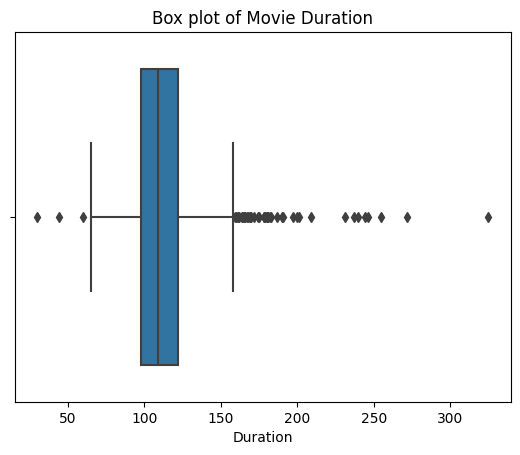

In [27]:
# Let's better understand a distribution of a movie duration
sns.boxplot(x=df['runtime'])
plt.xlabel('Duration')
plt.title('Box plot of Movie Duration')
plt.show()

In [28]:
# Descriptive statistics after some processing
df.describe()

,runtime,metascore,userscore,num_awards,num_words_title
count,2033.000000,2033.000000,1951.000000,2033.000000,2033.000000
mean,111.935563,59.153960,6.672629,1.051648,2.836203
std,21.167203,16.766119,1.303777,0.990997,1.763092
min,30.000000,9.000000,1.100000,0.000000,1.000000
25%,98.000000,47.000000,5.900000,0.000000,2.000000
50%,109.000000,60.000000,6.800000,1.000000,2.000000
75%,122.000000,72.000000,7.600000,2.000000,4.000000
max,325.000000,100.000000,9.100000,3.000000,17.000000


### Statistical analysis: runtime & awards

So as this plot suggests, the movies can be divided into being either over 112 minutes long, or under 112 minutes long. The first group might be referred to as "box office hits", while the second group might be named "art movies".

I am conducting a statistical analysis to see if there is a positive, neutral or negative tendency for art movies to on average receive more awards than those in the "box office hits" category.

In [29]:
# step 1: split the data into two Groups
art_movies = df[df['runtime'] < df['runtime'].mean()]
box_office_hits = df[df['runtime'] >= df['runtime'].mean()]

# step 2: calculate the average bumber of awards for each group
avg_art_movies = art_movies['num_awards'].mean()
avg_box_office_hits = box_office_hits['num_awards'].mean()

# step 3: perform statistical comparison
# Since the distribution of awards count may not be normal, we can use a non-parametric test like the Mann-Whitney U test
# This test compares the medians of two independent samples
statistic, p_value = stats.mannwhitneyu(art_movies['num_awards'], box_office_hits['num_awards'])

# step 4: interpret the results
print("Average Number of Awards for Movies Below 100 Minutes:", avg_art_movies)
print("Average Number of Awards for Movies Above 100 Minutes:", avg_box_office_hits)
print("Mann-Whitney U Test p-value:", p_value)

if p_value < 0.05:
    print("There is a statistically significant difference in the average number of awards between movies below and above 100 minutes.")
    if avg_art_movies > avg_box_office_hits:
        print(f"Movies below {df['runtime'].mean():.2f} minutes tend to receive more awards on average.")
    else:
        print(f"Movies abov {df['runtime'].mean():.2f} minutes tend to receive more awards on average.")
else:
    print("There is no statistically significant difference in the average number of awards between movies below and above 100 minutes.")


Average Number of Awards for Movies Below 100 Minutes: 0.8262411347517731
Average Number of Awards for Movies Above 100 Minutes: 1.332596685082873
Mann-Whitney U Test p-value: 2.8158124412083857e-29
There is a statistically significant difference in the average number of awards between movies below and above 100 minutes.
Movies abov 111.94 minutes tend to receive more awards on average.


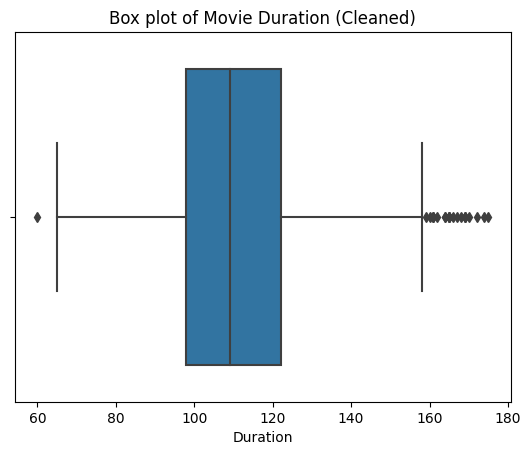

2033
2006


In [30]:
# step 6: Outlier Detection and Removal using z-score
# As a rule of thumb, anything that lies outside 3 STD from the mean will be discarded as these are extremes.
df_clean = df.dropna(subset=['runtime'])
z_scores = np.abs(stats.zscore(df_clean['runtime']))  # Compute z-scores for duration column
threshold =  3

# Filter out rows where absolute z-score exceeds the threshold
df_clean = df_clean[(z_scores < threshold)]

# Visualize the cleaned data
sns.boxplot(x=df_clean['runtime'])
plt.xlabel('Duration')
plt.title('Box plot of Movie Duration (Cleaned)')
plt.show()

print(len(df))
print(len(df_clean))
df = df_clean

# A checkpoint variable to be used later.
RUNTIME = df['runtime']

We are left with 2006 movies overall.

### Correlation matrix

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


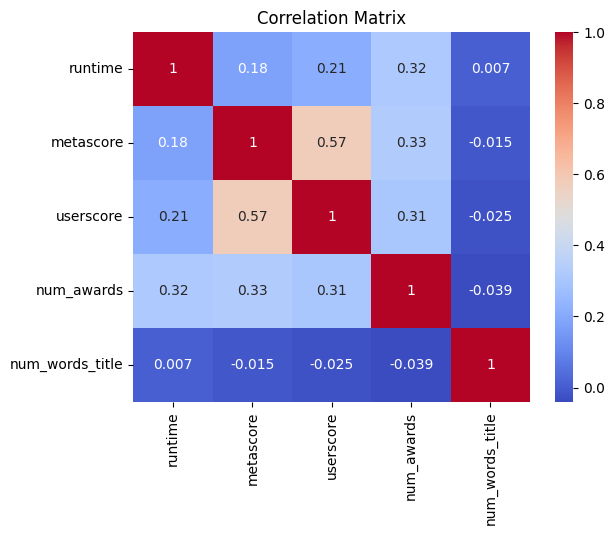

                  runtime  metascore  userscore  num_awards  num_words_title
runtime          1.000000   0.175789   0.212274    0.315370         0.006985
metascore        0.175789   1.000000   0.570093    0.328163        -0.014757
userscore        0.212274   0.570093   1.000000    0.308420        -0.024787
num_awards       0.315370   0.328163   0.308420    1.000000        -0.039490
num_words_title  0.006985  -0.014757  -0.024787   -0.039490         1.000000


In [31]:
# Generate and display a heatmap of the correlation matrix for the dataframe
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

print(correlation_matrix)

The correlation coefficient between 'runtime' and 'metascore' is approximately 0.18, indicating a weak positive correlation. This means that there is a tendency for movies with longer runtimes to have slightly higher metascores, but the relationship is weak.

The correlation coefficient between 'runtime' and 'userscore' is approximately 0.21, also indicating a weak positive correlation. Similarly, this suggests that there is a slight tendency for movies with longer runtimes to have slightly higher user scores, but again, the relationship is not very strong.

The correlation coefficient between 'metascore' and 'userscore' is approximately 0.67, indicating a moderate positive correlation. This suggests that there is a moderate tendency for movies with higher metascores to also have higher user scores.

It is fair to say that the number of awards is equally influenced by all three (runtime, metascore, userscore) other numerical metrics in this data, as their correlation coefficient hovers below 0.3.

The number of words has the least significant impact on the awards won, only contributing with a whopping -4% in terms of correlation.

## Feature engineering

Userscore and metascore is removed, as the studio cannot know in advance what the userscore will be before releasing the movie. That would also be a confounding variable which is in connection with the release date itself. Moreover, userscore and the awards_won almost by definition are highly correlating (yet not necessarily causally dependent) variables, giving me sound reasons to get rid of the column.

In [32]:
# Drop the following columns, the explanation why is above
df.drop(columns=['userscore', 'metascore'], inplace=True)

In [33]:
df

,url,title,rating,runtime,director,genre,awards,RelDate,num_awards,num_words_title
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,Roland Emmerich,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,2,2
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,Baltasar KormÃ¡kur,"Comedy,Romance",NaN,7/25/2001,0,1
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,Renny Harlin,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,1,2
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,Steve McQueen,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,3,4
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,Danny Boyle,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,3,2
...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,Abel Ferrara,"Thriller,War",NaN,11/19/2021,0,3
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,James Franco,"Drama,Comedy",NaN,9/20/2019,0,1
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,David Fincher,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,3,1
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,Drake Doremus,"Sci-Fi,Romance",NaN,7/20/2018,0,1


### One-Hot encoding of ratings, genres, and directors

One-hot encoding is a technique used to represent categorical variables as binary vectors. It converts categorical variables into a format that can be provided to ML algorithms to improve predictive performance. In regression tasks such as this one, one-hot encoding is quite useful as we are dealing with categorical features that do not have an inherent ordinal relationship.

As ratings, genres both contain strings, they are of not much use currently. By turning them into categorical data however they can be used for a regression model.

Every string is separated from eachother with a ",".

### Ratings

In [34]:
# extracting the unique values from the 'rating' column
unique_ratings = df['rating'].unique()

# create binary features for 'rating'
rating_features = pd.get_dummies(df['rating'], prefix='rating')

# encoding binary features into a new DataFrame
encoded_df = pd.concat([rating_features], axis=1)

# concatenate the new DataFrame with the original DataFrame
df = pd.concat([df, encoded_df], axis=1)


In [35]:
# Count the number of unique elements in the list `unique_ratings`
len(unique_ratings)

16

In [36]:
# Display the unique ratings
print(unique_ratings)

['| PG-13' '| Not Rated' '| R' '| TV-MA' '| PG' '| Unrated' '| G'
 '| NC-17' '| NR' '| PG--13' '| TV-G' '| TV-14' '| TV-PG' '| PG-13`'
 '| Open' '| Approved']


In [37]:
df

,url,title,rating,runtime,director,genre,awards,RelDate,num_awards,num_words_title,...,rating_| PG,rating_| PG--13,rating_| PG-13,rating_| PG-13`,rating_| R,rating_| TV-14,rating_| TV-G,rating_| TV-MA,rating_| TV-PG,rating_| Unrated
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,Roland Emmerich,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,2,2,...,0,0,1,0,0,0,0,0,0,0
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,Baltasar KormÃ¡kur,"Comedy,Romance",NaN,7/25/2001,0,1,...,0,0,0,0,0,0,0,0,0,0
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,Renny Harlin,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,1,2,...,0,0,1,0,0,0,0,0,0,0
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,Steve McQueen,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,3,4,...,0,0,0,0,1,0,0,0,0,0
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,Danny Boyle,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,3,2,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,Abel Ferrara,"Thriller,War",NaN,11/19/2021,0,3,...,0,0,0,0,1,0,0,0,0,0
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,James Franco,"Drama,Comedy",NaN,9/20/2019,0,1,...,0,0,0,0,1,0,0,0,0,0
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,David Fincher,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,3,1,...,0,0,0,0,1,0,0,0,0,0
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,Drake Doremus,"Sci-Fi,Romance",NaN,7/20/2018,0,1,...,0,0,0,0,1,0,0,0,0,0


#### Feature engineering of ratings

Having all 19 separate ratings would be an overkill, as many of them refer to the same thing: Should a child watch the movie or not? Is it family friendly? Is there profanity in the movie?

For that reason, I am combining the columns according to this principle.

I am getting rid of the column "rating_| Not Rated", "rating_| Unrated" and "rating_| NR" as they have too strong of an impact over the dataset.

In [38]:
# Create two lists: one with ratings suitable for all audiences, and another for adult audiences.
ratings_for_everyone = ['rating_| PG', 'rating_| G', 'rating_| PG-13', 'rating_| PG-13`', 'rating_| PG--13', 'rating_| TV-G', 'rating_| TV-PG', 'rating_| Approved']
ratings_for_adults = ['rating_| R', 'rating_| TV-MA', 'rating_| NC-17', 'rating_| TV-14', 'rating_| Open']

# Create the new columns based on the presence of ratings in the original columns
df['for_everyone'] = df[ratings_for_everyone].sum(axis=1)
df['for_adults'] = df[ratings_for_adults].sum(axis=1)

# Replace any non-zero values with 1 to indicate presence of at least one rating in the category
df['for_everyone'] = (df['for_everyone'] > 0).astype(int)
df['for_adults'] = (df['for_adults'] > 0).astype(int)

df.drop(ratings_for_everyone, axis=1, inplace=True)
df.drop(ratings_for_adults, axis=1, inplace=True)

df.drop(['rating_| Not Rated'], axis=1, inplace=True)
df.drop(['rating_| Unrated'], axis=1, inplace=True)
df.drop(['rating_| NR'], axis=1, inplace=True)

In [39]:
df

,url,title,rating,runtime,director,genre,awards,RelDate,num_awards,num_words_title,for_everyone,for_adults
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,Roland Emmerich,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,2,2,1,0
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,Baltasar KormÃ¡kur,"Comedy,Romance",NaN,7/25/2001,0,1,0,0
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,Renny Harlin,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,1,2,1,0
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,Steve McQueen,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,3,4,0,1
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,Danny Boyle,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,3,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,Abel Ferrara,"Thriller,War",NaN,11/19/2021,0,3,0,1
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,James Franco,"Drama,Comedy",NaN,9/20/2019,0,1,0,1
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,David Fincher,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,3,1,0,1
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,Drake Doremus,"Sci-Fi,Romance",NaN,7/20/2018,0,1,0,1


### Genres

In [40]:
# Extract and create series of unique genres from a DataFrame column containing comma-separated genre strings
genres_overlap = df['genre'].str.split(',')
unique_genres = []
for genre in genres_overlap:
    try:
        unique_genres.extend(genre)
    except:
        continue
unique_genres = pd.Series(list(set(unique_genres)))

In [41]:
# Display unique genres
unique_genres

0          Comedy
1     Documentary
2       Adventure
3             War
4       Biography
5         History
6          Action
7           Sport
8          Horror
9           Crime
10          Music
11          Adult
12      Animation
13         Sci-Fi
14         Family
15           News
16        Musical
17        Mystery
18          Drama
19        Fantasy
20        Western
21        Romance
22       Thriller
dtype: object

In [42]:
# Creating binary features for each unique value in 'rating' column
for genre in unique_genres:
    
    df[f'genre_{genre}'] = df['genre'].apply(lambda x: 1 if genre in str(x).split(",") else 0)


Due to the 'curse of dimensionality', I have to combine certain genres in order to avoid overfitting.

In [43]:
# Grouping the genres
mainstream_genres = ['genre_Drama', 'genre_Action', 'genre_Romance', 'genre_Comedy', 'genre_Adventure', 'genre_Thriller', 'genre_Crime']
specialized_genres = ['genre_Mystery', 'genre_Fantasy', 'genre_Horror', 'genre_Western', 'genre_Sci-Fi', 'genre_War']
non_fiction_genres = ['genre_News', 'genre_Biography', 'genre_Documentary', 'genre_History']
family_oriented_genres = ['genre_Family', 'genre_Animation']
music_and_musical_genres = ['genre_Music', 'genre_Musical']
miscellaneous_genres = ['genre_Sport']

# Creating new columns
df['Mainstream_Genres'] = df[mainstream_genres].sum(axis=1)
df['Specialized_Genres'] = df[specialized_genres].sum(axis=1)
df['Non_Fiction_Genres'] = df[non_fiction_genres].sum(axis=1)
df['Family_Oriented_Genres'] = df[family_oriented_genres].sum(axis=1)
df['Music_and_Musical_Genres'] = df[music_and_musical_genres].sum(axis=1)
df['Miscellaneous_Genres'] = df[miscellaneous_genres].sum(axis=1)

# Dropping the original genre columns
df.drop(columns=mainstream_genres + specialized_genres + non_fiction_genres + family_oriented_genres + music_and_musical_genres + miscellaneous_genres, inplace=True)


In [44]:
df

,url,title,rating,runtime,director,genre,awards,RelDate,num_awards,num_words_title,for_everyone,for_adults,genre_Adult,Mainstream_Genres,Specialized_Genres,Non_Fiction_Genres,Family_Oriented_Genres,Music_and_Musical_Genres,Miscellaneous_Genres
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,Roland Emmerich,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,2,2,1,0,0,2,1,0,0,0,0
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,Baltasar KormÃ¡kur,"Comedy,Romance",NaN,7/25/2001,0,1,0,0,0,2,0,0,0,0,0
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,Renny Harlin,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,1,2,1,0,0,3,0,0,0,0,0
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,Steve McQueen,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,3,4,0,1,0,1,0,2,0,0,0
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,Danny Boyle,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,3,2,0,1,0,3,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,Abel Ferrara,"Thriller,War",NaN,11/19/2021,0,3,0,1,0,1,1,0,0,0,0
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,James Franco,"Drama,Comedy",NaN,9/20/2019,0,1,0,1,0,2,0,0,0,0,0
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,David Fincher,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,3,1,0,1,0,3,1,0,0,0,0
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,Drake Doremus,"Sci-Fi,Romance",NaN,7/20/2018,0,1,0,1,0,1,1,0,0,0,0


### Directors

In [45]:
# Uusing the previously created unique_directors series
# Creating binary features for each unique value in 'director' column
for director in famous_directors:
    
    df[f'director_{director}'] = df['director'].apply(lambda x: 1 if director in str(x).split(",") else 0)

# Dropping the original 'rating' columns
df.drop(['director'], axis=1, inplace=True)

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [46]:
df

,url,title,rating,runtime,genre,awards,RelDate,num_awards,num_words_title,for_everyone,...,director_Steven Spielberg,director_Ron Howard,director_Ridley Scott,director_Alex Gibney,director_Clint Eastwood,director_Spike Lee,director_Woody Allen,director_Michael Winterbottom,director_Tyler Perry,director_Steven Soderbergh
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,109.0,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,2,2,1,...,0,0,0,0,0,0,0,0,0,0
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,88.0,"Comedy,Romance",NaN,7/25/2001,0,1,0,...,0,0,0,0,0,0,0,0,0,0
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,108.0,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,1,2,1,...,0,0,0,0,0,0,0,0,0,0
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,134.0,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,3,4,0,...,0,0,0,0,0,0,0,0,0,0
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,94.0,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,3,2,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,85.0,"Thriller,War",NaN,11/19/2021,0,3,0,...,0,0,0,0,0,0,0,0,0,0
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,96.0,"Drama,Comedy",NaN,9/20/2019,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,157.0,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,3,1,0,...,0,0,0,0,0,0,0,0,0,0
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,104.0,"Sci-Fi,Romance",NaN,7/20/2018,0,1,0,...,0,0,0,0,0,0,0,0,0,0


## Scaling the numerical columns

Scaling numerical columns is essential for ensuring that my future machine learning models can effectively learn from the data, interpret feature importance correctly, and handle the challenges posed by high-dimensional or diverse feature spaces.

In [47]:
# Select numeric columns for normalization
numeric_columns = ['runtime', 'num_awards', 'Mainstream_Genres', 'Specialized_Genres',
                   'Non_Fiction_Genres', 'Family_Oriented_Genres', 'Music_and_Musical_Genres',
                   'Miscellaneous_Genres']

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
df['Real Awards'] = df['num_awards']
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


In [48]:
df

,url,title,rating,runtime,genre,awards,RelDate,num_awards,num_words_title,for_everyone,...,director_Ron Howard,director_Ridley Scott,director_Alex Gibney,director_Clint Eastwood,director_Spike Lee,director_Woody Allen,director_Michael Winterbottom,director_Tyler Perry,director_Steven Soderbergh,Real Awards
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,0.426087,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",3/7/2008,0.666667,2,1,...,0,0,0,0,0,0,0,0,0,2
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,0.243478,"Comedy,Romance",NaN,7/25/2001,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,0
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,0.417391,"Action,Thriller,Crime",#71MostSharedMovieof2009,3/27/2009,0.333333,2,1,...,0,0,0,0,0,0,0,0,0,1
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,0.643478,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",10/18/2013,1.000000,4,0,...,0,0,0,0,0,0,0,0,0,3
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,0.295652,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",11/5/2010,1.000000,2,0,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,0.217391,"Thriller,War",NaN,11/19/2021,0.000000,3,0,...,0,0,0,0,0,0,0,0,0,0
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,0.313043,"Drama,Comedy",NaN,9/20/2019,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,0
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,0.843478,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",3/2/2007,1.000000,1,0,...,0,0,0,0,0,0,0,0,0,3
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,0.382609,"Sci-Fi,Romance",NaN,7/20/2018,0.000000,1,0,...,0,0,0,0,0,0,0,0,0,0


### Scaling a non-numerical column: Release date

It is not an unfounded assumption to say that a movie released in the second half of a calendar year might perform better or worse than ones released in the first half. Whether there is a correlation with the number of awards is yet unclear, and so is the nature of this correlation, but as a metric it might serve an interesting purpose. Therefore:

In [49]:
def datetime_to_normalized_value(dt):
    # This function will turn any datetime into a normalized value
    # Between 0 and 1.
    # This might be useful to set the release date to maximize num_awards precision 
    start_of_year = datetime.datetime(dt.year, 1, 1)
    end_of_year = datetime.datetime(dt.year, 12, 31)
    
    total_days_in_year = (end_of_year - start_of_year).days + 1
    
    days_elapsed = (dt - start_of_year).days
    
    normalized_value = days_elapsed / total_days_in_year
    
    return normalized_value

# Example usage
date = datetime.datetime(2023, 6, 15)  # Example date
normalized_value = datetime_to_normalized_value(date)
print("Normalized value:", normalized_value)

Normalized value: 0.4520547945205479


In [50]:
# Convert 'RelDate' column to datetime
df['RelDate'] = pd.to_datetime(df['RelDate'], format='%m/%d/%Y')

df['Normalized_RelDate'] = df['RelDate'].apply(datetime_to_normalized_value)

# Drop the original 'RelDate' column
df.drop(columns=['RelDate'], inplace=True)

In [51]:
df

,url,title,rating,runtime,genre,awards,num_awards,num_words_title,for_everyone,for_adults,...,director_Ridley Scott,director_Alex Gibney,director_Clint Eastwood,director_Spike Lee,director_Woody Allen,director_Michael Winterbottom,director_Tyler Perry,director_Steven Soderbergh,Real Awards,Normalized_RelDate
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,0.426087,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",0.666667,2,1,0,...,0,0,0,0,0,0,0,0,2,0.180328
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,0.243478,"Comedy,Romance",NaN,0.000000,1,0,0,...,0,0,0,0,0,0,0,0,0,0.561644
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,0.417391,"Action,Thriller,Crime",#71MostSharedMovieof2009,0.333333,2,1,0,...,0,0,0,0,0,0,0,0,1,0.232877
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,0.643478,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",1.000000,4,0,1,...,0,0,0,0,0,0,0,0,3,0.794521
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,0.295652,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",1.000000,2,0,1,...,0,0,0,0,0,0,0,0,3,0.843836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,0.217391,"Thriller,War",NaN,0.000000,3,0,1,...,0,0,0,0,0,0,0,0,0,0.882192
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,0.313043,"Drama,Comedy",NaN,0.000000,1,0,1,...,0,0,0,0,0,0,0,0,0,0.717808
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,0.843478,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",1.000000,1,0,1,...,0,0,0,0,0,0,0,0,3,0.164384
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,0.382609,"Sci-Fi,Romance",NaN,0.000000,1,0,1,...,0,0,0,0,0,0,0,0,0,0.547945


### Correlation matrix with the scaled numericals and one-hot encoded categories

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


num_awards                 1.000000
Real Awards                1.000000
runtime                    0.315370
Specialized_Genres         0.226079
Mainstream_Genres          0.186507
                             ...   
director_Abel Ferrara     -0.058682
director_Tyler Perry      -0.058910
director_Rod Lurie        -0.062348
director_FranÃ§ois Ozon   -0.066273
director_Ben Wheatley     -0.066669
Name: num_awards, Length: 271, dtype: float64


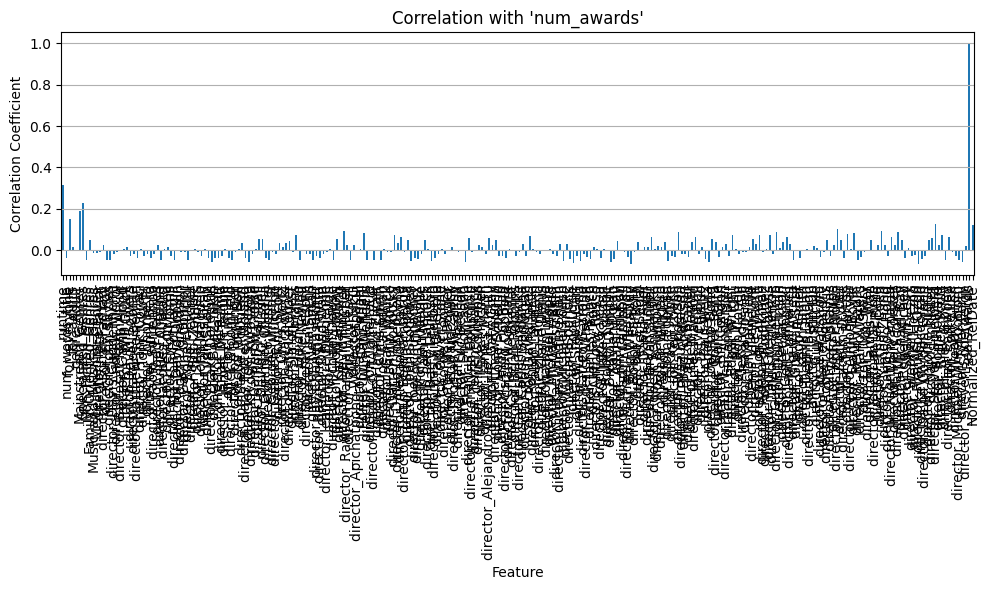

In [52]:
correlation_matrix = df.corr()['num_awards']
print(correlation_matrix.sort_values(ascending=False))

# Plot the correlation coefficients
plt.figure(figsize=(10, 6))
correlation_matrix.drop('num_awards').plot(kind='bar')
plt.title("Correlation with 'num_awards'")
plt.xlabel("Feature")
plt.ylabel("Correlation Coefficient")
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

This is a useless plot, because it contains 250+ directors. However, from a distance it is clear that having some directors over others will influence the probability of winning an award or not by a non-negligible factor.

In [53]:

print(correlation_matrix.index)

Index(['runtime', 'num_awards', 'num_words_title', 'for_everyone',
       'for_adults', 'genre_Adult', 'Mainstream_Genres', 'Specialized_Genres',
       'Non_Fiction_Genres', 'Family_Oriented_Genres',
       ...
       'director_Ridley Scott', 'director_Alex Gibney',
       'director_Clint Eastwood', 'director_Spike Lee', 'director_Woody Allen',
       'director_Michael Winterbottom', 'director_Tyler Perry',
       'director_Steven Soderbergh', 'Real Awards', 'Normalized_RelDate'],
      dtype='object', length=271)


### A little more usable plot

num_awards                  1.000000
runtime                     0.315370
Specialized_Genres          0.226079
Mainstream_Genres           0.186507
for_everyone                0.148705
Normalized_RelDate          0.121777
Family_Oriented_Genres      0.049933
for_adults                  0.015879
genre_Adult                -0.000978
Music_and_Musical_Genres   -0.012907
Miscellaneous_Genres       -0.013533
num_words_title            -0.039490
Non_Fiction_Genres         -0.046152
Name: num_awards, dtype: float64


The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


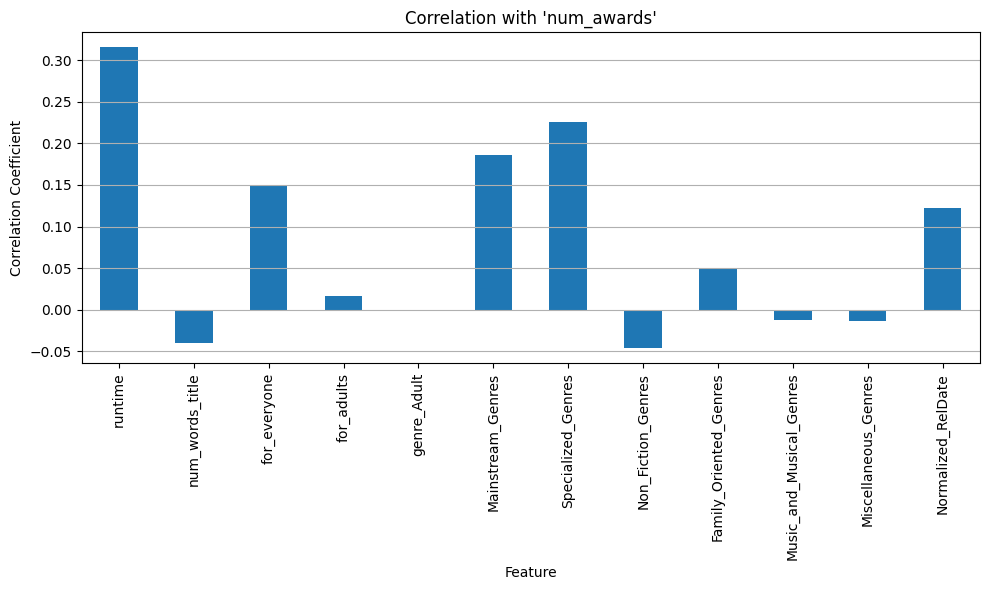

In [54]:
# Getting rid of those famous directors, just for now
remove = [f'director_{director}' for director in famous_directors]
remove.append('Real Awards')
correlation_matrix = df.drop(columns=remove).corr()['num_awards']
print(correlation_matrix.sort_values(ascending=False))

# Plot the correlation coefficients
plt.figure(figsize=(10, 6))
correlation_matrix.drop('num_awards').plot(kind='bar')
plt.title("Correlation with 'num_awards'")
plt.xlabel("Feature")
plt.ylabel("Correlation Coefficient")
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

So according to this graph the number of awards is most influenced by the runtime, that it is for everyone, it is specialized and that it is released later the year.

## EXPORTING THE DF

In [55]:
# Remove specific columns from a DataFrame and export the modified DataFrame to a CSV file without the removed columns.
to_export = df.drop(columns=['url', 'title', 'rating', 'genre', 'awards', 'num_words_title'])

csv_file_path = 'movies_processed_data.csv'

to_export.to_csv(csv_file_path, index=False)

In [56]:
# Count the occurrences of each value in the 'num_awards' column
df['num_awards'].value_counts()

0.000000    771
0.333333    548
0.666667    516
1.000000    171
Name: num_awards, dtype: int64

# SPLITTING THE DATA

The feature columns include the normalized runtime, release date, every genre, the for_everyone and for_adults columns and the famous_directors. We have discarded the userscore and metascore columns as these correlated moderately highly with the number of awards, therefore they do not provide the model with a significant amount of information. 

In other words, even though there is a correlation between userscore, metascore and num_awards, through repeated iterations that included and did not include the former two, it has been shown that there is indeed no CAUSATION.

Meaning that we can safely discard userscore and metascore from the scope of this case study.

In [57]:
df


,url,title,rating,runtime,genre,awards,num_awards,num_words_title,for_everyone,for_adults,...,director_Ridley Scott,director_Alex Gibney,director_Clint Eastwood,director_Spike Lee,director_Woody Allen,director_Michael Winterbottom,director_Tyler Perry,director_Steven Soderbergh,Real Awards,Normalized_RelDate
7,https://www.metacritic.com/movie/10000-bc,"10,000 BC",| PG-13,0.426087,"Adventure,Drama,Fantasy","#23MostDiscussedMovieof2008 , #27MostSharedMov...",0.666667,2,1,0,...,0,0,0,0,0,0,0,0,2,0.180328
10,https://www.metacritic.com/movie/101-reykjavik,ReykjavÃ­k,| Not Rated,0.243478,"Comedy,Romance",NaN,0.000000,1,0,0,...,0,0,0,0,0,0,0,0,0,0.561644
21,https://www.metacritic.com/movie/12-rounds,12 Rounds,| PG-13,0.417391,"Action,Thriller,Crime",#71MostSharedMovieof2009,0.333333,2,1,0,...,0,0,0,0,0,0,0,0,1,0.232877
23,https://www.metacritic.com/movie/12-years-a-slave,12 Years a Slave,| R,0.643478,"Biography,Drama,History","#1BestMovieof2013 , #17MostDiscussedMovieof201...",1.000000,4,0,1,...,0,0,0,0,0,0,0,0,3,0.794521
25,https://www.metacritic.com/movie/127-hours,127 Hours,| R,0.295652,"Adventure,Biography,Drama,Thriller","#23BestMovieof2010 , #26MostDiscussedMovieof20...",1.000000,2,0,1,...,0,0,0,0,0,0,0,0,3,0.843836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,https://www.metacritic.com/movie/zeros-and-ones,Zeros and Ones,| R,0.217391,"Thriller,War",NaN,0.000000,3,0,1,...,0,0,0,0,0,0,0,0,0,0.882192
11339,https://www.metacritic.com/movie/zeroville,Zeroville,| R,0.313043,"Drama,Comedy",NaN,0.000000,1,0,1,...,0,0,0,0,0,0,0,0,0,0.717808
11348,https://www.metacritic.com/movie/zodiac,Zodiac,| R,0.843478,"Drama,Mystery,Thriller,Crime","#48BestMovieof2007 , #28MostDiscussedMovieof20...",1.000000,1,0,1,...,0,0,0,0,0,0,0,0,3,0.164384
11349,https://www.metacritic.com/movie/zoe,Zoe,| R,0.382609,"Sci-Fi,Romance",NaN,0.000000,1,0,1,...,0,0,0,0,0,0,0,0,0,0.547945


In [58]:
# Drop the listed columns below as they have either been transformed into normalised or one-hot encoded columns, 
# such as ratings, genres, etc, or proven to have no or no significant influence on movie receiving an award, such as num_words_length

feature_columns = df.drop(columns=['num_awards', 'Real Awards', 'url', 'title', 'rating', 'genre', 'awards', 'num_words_title']).columns

# Shuffling the data to ensure entropy of data
df_shuffled = shuffle(df, random_state=40)

# Separating predictors and the target variable
X = df_shuffled[feature_columns]
y = df_shuffled['num_awards']

# Shape of X and y, ensuring correctness
print("Shape of features (X):", X.shape)
print("Shape of target variable num_awards (y):", y.shape)

Shape of features (X): (2006, 268)
Shape of target variable num_awards (y): (2006,)


In [59]:
# Defining ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15


# Split the data into train, validation, and test sets:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=test_ratio, stratify=y, random_state=10)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=val_ratio/(train_ratio+val_ratio), stratify=y_train_val, random_state=30)



In [60]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (1404, 268)
Shape of X_val: (301, 268)
Shape of X_test: (301, 268)
Shape of y_train: (1404,)
Shape of y_val: (301,)
Shape of y_test: (301,)


# RANDOM FOREST

Understanding Random Forest:

Random Forest is a powerful ensemble learning algorithm that combines multiple decision trees to make predictions. Each decision tree is trained on a random subset of the data and provides its prediction, and the final prediction is made by aggregating the predictions of all the trees. This ensemble approach helps to reduce overfitting and improve generalization performance.

Advantages of Random Forest include its ability to handle large datasets with high dimensionality, robustness to overfitting, and capability to capture complex relationships between features and the target variable.

Suitability for the Task:

Random Forest is well-suited for predicting user ratings of movies for several reasons:
1. Handling Mixed Data Types: Random Forest can effectively handle a mix of numerical and categorical features, which is common in movie-related datasets containing attributes like runtime, genre, and ratings.
2. Capturing Non-linear Relationships: Movies are multifaceted, and user ratings can depend on various factors in complex, non-linear ways. Random Forest excels at capturing such intricate relationships, making it suitable for modeling the complexities of movie preferences.

Feature Importance:

Random Forest provides valuable insights into feature importance by evaluating how much each feature contributes to decreasing impurity across all decision trees in the ensemble. Features that consistently decrease impurity across trees are deemed more important. This allows us to identify which movie attributes, such as runtime, genre, and ratings, have the most significant impact on user ratings. These insights can inform movie production and marketing strategies, helping studios focus on factors that matter most to users.

Model Evaluation:

To evaluate the performance of the Random Forest model, common regression metrics like Mean Squared Error (MSE), R-squared (R2), or Mean Absolute Error (MAE) can be used. These metrics quantify the model's predictive accuracy and how well it captures the variance in user ratings.
Cross-validation is crucial to ensure the model's generalizability and robustness by training and evaluating it on multiple subsets of the data.

Explainability:

Random Forest offers explainability through its ensemble approach. By aggregating decisions from multiple decision trees, it provides insights into how predictions are made. Additionally, feature importance scores and decision paths can be interpreted to understand the factors influencing user ratings of movies. This transparency enhances trust in the model's predictions and facilitates informed decision-making.

Conclusion:

In summary, Random Forest is an ideal choice for predicting user ratings of movies due to its ability to handle mixed data types, capture complex relationships, provide feature importance insights, and offer explainability. Leveraging Random Forest can empower film studios to make data-driven decisions, guiding their production and marketing strategies to maximize the likelihood of movies receiving higher user ratings and achieving greater success.

In [127]:
# Random Forest Model
rf_model = RandomForestRegressor()

# Define hyperparameters for grid search

rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [10, 17, 25],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

"""In case you want to run it, avoid unnecessary grid searches. Best model par. have been found, see below"""
"""
rf_param_grid = {
    'n_estimators': [200],
    'max_depth': [10],
    'min_samples_split': [25],
    'min_samples_leaf': [2],
    'max_features': ['sqrt'],
    'bootstrap': [False]
}"""

# Perform grid search
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=5, n_jobs=-1, verbose=2)
rf_grid_search.fit(X_train, y_train)

# Get the best parameters
rf_best_params = rf_grid_search.best_params_

# Train the Random Forest model with the best parameters
rf_best_model = RandomForestRegressor(**rf_best_params)
rf_best_model.fit(X_train, y_train)

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


RandomForestRegressor(max_features='log2', min_samples_split=10,
                      n_estimators=300)

In [128]:
# Predict on the validation set using the trained Random Forest model
rf_pred = rf_best_model.predict(X_val)

# Calculate the mean squared error
rf_mse = mean_squared_error(y_val, rf_pred)

print("Random Forest Mean Squared Error:", rf_mse)

Random Forest Mean Squared Error: 0.08137395515080743


ABNORMALIZED NUM_AWARDS: Random Forest Mean Squared Error: 0.4141864235873618

NORMALIZED NUM_AWARDS: Random Forest Mean Squared Error: 0.04597949228430678

NORMALIZED NUM_AWARDS and USER&META SCORES REMOVED: Random Forest Mean Squared Error: 0.06564033449736775

this removal will help in demonstrating the nature of these models, as they will allow us to test a movie's success in terms of awards before even having to release it.

In [129]:
# Saving the model:
# RF
model_path = 'models/final_rf_model.pkl'
with open(model_path, 'wb') as f:
    pickle.dump(rf_best_model, f)

 99%|===================| 297/301 [00:42<00:00]        

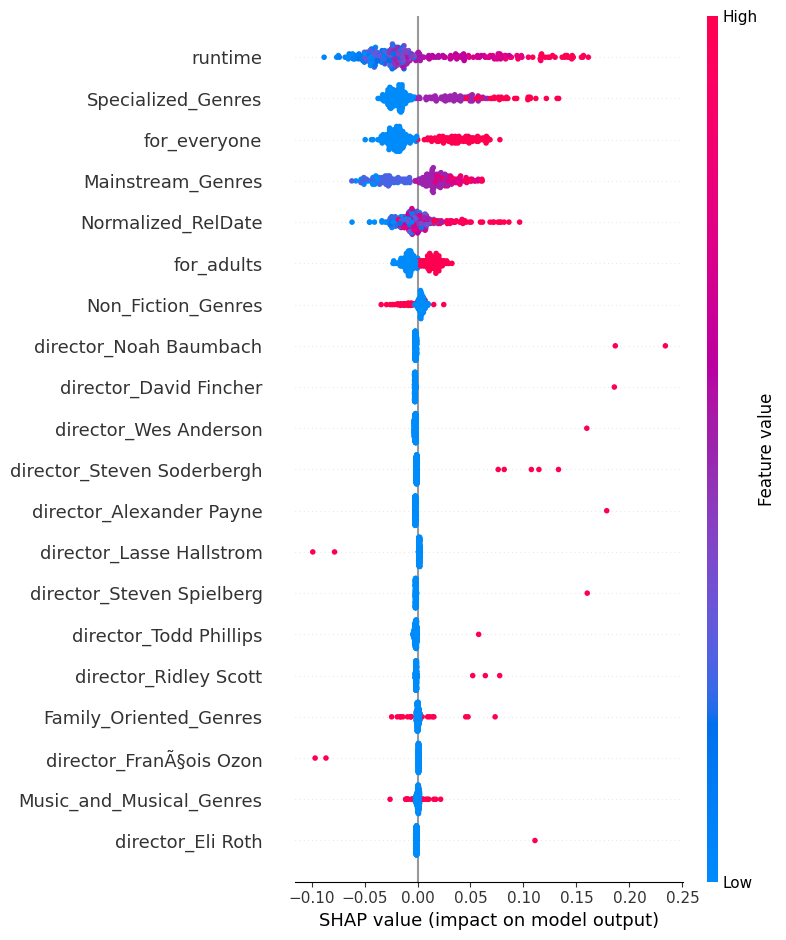

In [130]:
# SHAP explainer object
explainer = shap.Explainer(rf_best_model, X_train, check_additivity=False)

# SHAP values for the testing data
shap_values = explainer.shap_values(X_test, check_additivity=False)

# Values visualized
shap.summary_plot(shap_values, X_test)

Interpretation:

Redness means MORE of a given property, and its position on the X axis represents how having more of said feature will impact the output: will it result in more awards (right side) or less (left side)

For instance:

1. **Runtime**: This is the most influential feature according to the plot. The presence of many pink/red dots to the right of the zero line indicates that longer movies have a positive impact on the model's output. Since 'runtime' is at the top of the plot, it has the highest overall impact on the predictions made by the model.

2. **Specialized_Genres**: This feature is also significant but has a mix of positive and negative impacts on the model's output, as indicated by the spread of dots on both sides of the zero line. The color distribution suggests that whether a genre is considered specialized can both increase and decrease the prediction, depending on the context.

3. **Mainstream_Genres**: Similar to 'Specialized_Genres', this feature has a variety of impacts on the model's output, with a relatively even spread of pink/red dots on both sides of the zero line. This indicates that whether a movie belongs to a mainstream genre influences the model's prediction in both positive and negative ways.

4. **Normalized_RelDate**: The 'Normalized_RelDate' might represent a feature related to the release date of the movie, normalized in some way (perhaps to account for seasonality or time since release). This feature shows a cluster of points mainly on the positive side, suggesting that whatever aspect of the release date this represents tends to have a positive impact on the model's output.

5. **for_adults**: This binary feature (likely indicating whether a movie is intended for adults) shows a concentration of dots on the negative side, implying that movies for adults are more likely to decrease the prediction made by the model.


Benefits: 
Debugging to find which data categories cause the errors, closer look at incorrect predictions. 
Provide the basis for human friendly explanations and increase trust.
Data exploration - find hidden patters (non-linear) and interactions.

### Confusion matrix:

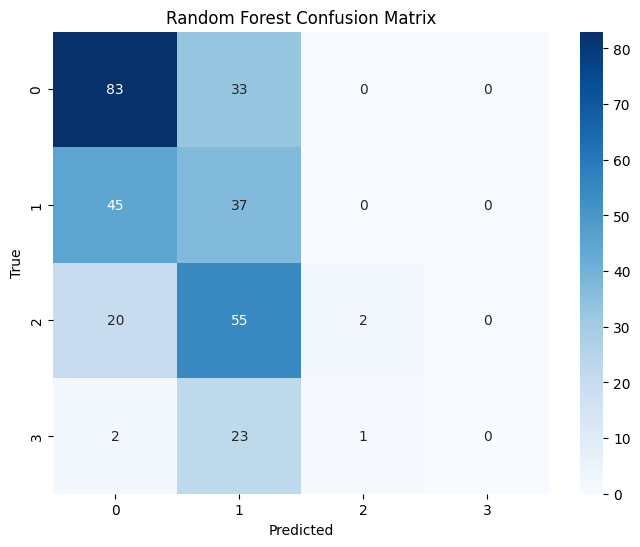

In [131]:
rf_predictions = rf_best_model.predict(X_test)

# The reason is that the model will predict a continous value for the num_awards.
# the resolution is decided precisely by taking the reciprocal of the max num_awards (pre-scaled)
# and if the prediction rounds to this resolution, it is deemed correct, else incorrect.
resolution = 1 / NUM_AWARDS.max()

## Rounding predictions to its nearest resolution (de-normalizing)
rf_rounded_predictions = rf_predictions // resolution

# Round the ground truth labels to the nearest resolution (only de-normalizing)
y_test_rounded = y_test  // resolution

# Turn rounded predictions and ground truth values to discrete class labels
rf_predicted_labels = np.clip(rf_rounded_predictions.astype(int), 0, NUM_AWARDS.max())
y_test_labels = np.clip(y_test_rounded.astype(int), 0, NUM_AWARDS.max())


rf_confusion_matrix = confusion_matrix(y_test_labels, rf_predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(rf_confusion_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Random Forest Confusion Matrix')
plt.show()

This confusion matrix might seem imbalanced in that there appears to be a blob of 82 movies that were predicted to receive 0 awards, and actually received 0 awards.

However, taking the sum of those that have won any and comparing that with the sum of non-award-winning ones, we can see there is only a marginal difference.

The model appears to lean towards predicting 0 awards instead of predicting a large number of awards-

In [132]:
# Calculate counts of underpredictions, correct predictions, overpredictions, and incorrect predictions based on a confusion matrix.
underpredicted_indices = np.triu(rf_confusion_matrix, k=1).sum(axis=1)
correct_indices = np.diag(rf_confusion_matrix)
overpredicted_indices = np.tril(rf_confusion_matrix, k=-1).sum(axis=0)

underpredicted_count = np.sum(underpredicted_indices)
correct_count = np.sum(correct_indices)
overpredicted_count = np.sum(overpredicted_indices)


print("Underpredictions:", underpredicted_count)
print("Correct predictions:", correct_count)
print("Overpredictions:", overpredicted_count)
print("Incorrect predictions", underpredicted_count + overpredicted_count)

Underpredictions: 33
Correct predictions: 122
Overpredictions: 146
Incorrect predictions 179


In [133]:
# Calculate precision
precision = precision_score(y_test_labels, rf_predicted_labels, average='weighted', zero_division=0)

# Calculate recall
recall = recall_score(y_test_labels, rf_predicted_labels, average='weighted', zero_division=0)

print("Precision:", precision)
print("Recall:", recall)

Precision: 0.45189368770764116
Recall: 0.4053156146179402


FULL DF:

Precision: 0.5197657487568272

Recall: 0.4816


DF ABOVE 100 MINUTES:

Precision: 0.45564026247309736

Recall: 0.3841726618705036



The low precision and recall scores obtained may be attributed to potential misinterpretation of the results rather than inherent issues with the model or data.

In [134]:
precision = []
recall = []
f1 = []

# Compute precision, recall, and F1 score for each class
for i in range(NUM_AWARDS.max() + 1):
    y_true = np.where(y_test_labels == i, 1, 0)  # Converting the labels to binary for the current class
    y_pred = np.where(rf_predicted_labels == i, 1, 0)  # Converting the predictions to binary for the current class
    precision_i = precision_score(y_true, y_pred)
    recall_i = recall_score(y_true, y_pred)
    f1_i = f1_score(y_true, y_pred)
    precision.append(precision_i)
    recall.append(recall_i)
    f1.append(f1_i)

# Dataframe for storing my results
metrics_df = pd.DataFrame({
    'Class': range(NUM_AWARDS.max() + 1),
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1
})

# Set the 'Class' column as the index
metrics_df.set_index('Class', inplace=True)

print(metrics_df)

       Precision    Recall  F1 Score
Class                               
0       0.553333  0.715517  0.624060
1       0.250000  0.451220  0.321739
2       0.666667  0.025974  0.050000
3       0.000000  0.000000  0.000000


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


>>## RANDOM FOREST 
>>>### is 53% accurate in determining that a movie will receive no awards.
>>>### is 24% accurate that it receives 1
>>>### but is 66% accurate that it receives 2!

>>>### has correctly identified 70% of the 0 awards.
>>>### and about 43% of movies winning 1 award.

# NEURAL NETWORKS

Understanding Neural Networks:

Neural Networks (NN) represent a class of machine learning algorithms inspired by the structure and functioning of the human brain. They consist of interconnected layers of nodes, known as neurons, where each neuron processes input data and passes its output to the next layer. Through a process called forward propagation, neural networks transform input data into predictions or classifications. During training, neural networks adjust their internal parameters, known as weights and biases, through backpropagation, optimizing them to minimize prediction errors.

Advantages of Neural Networks include their ability to learn complex patterns from data, adaptability to various types of data, and capability to handle large datasets effectively.

Suitability for the Task:

Neural Networks are well-suited for predicting the number of awards for movies due to their capacity to learn intricate patterns and relationships within the data.

We can take the following key factors into consideration about NN:
1. Non-linear Relationships: User ratings are influenced by numerous factors, including movie genre, cast, director, and viewer demographics. Neural Networks excel at capturing non-linear relationships between these factors, allowing them to model the complexities of user preferences effectively.
2. Feature Representation Learning: Neural Networks can automatically learn meaningful representations of input features, eliminating the need for manual feature engineering. This ability is beneficial when dealing with diverse movie attributes and user preferences, as the model can autonomously discover relevant patterns in the data.

FEATURE IMPORTANCE

In Neural Networks, interpreting feature importance can be challenging compared to traditional algorithms like Random Forest. However, techniques such as feature visualization, activation maximization, and gradient-based methods can provide insights into which features contribute most to the model's predictions. Understanding feature importance helps identify critical attributes influencing user ratings and informs decision-making processes.

MODEL EVALUATION

To evaluate the performance of a Neural Network model for predicting movie ratings, metrics such as Mean Squared Error (MSE), R-squared (R2), or Mean Absolute Error (MAE) can be utilized. Additionally, cross-validation ensures the model's robustness and generalizability by training and evaluating it on multiple subsets of the data.

EXPLAINABILITY

Neural Networks often face challenges regarding model explainability due to their complex architecture and high-dimensional parameter space. However, techniques such as sensitivity analysis, layer-wise relevance propagation, and saliency maps can provide insights into how the model makes predictions and which features are influential. Although achieving full explainability in Neural Networks remains a research area, these methods offer valuable interpretability to understand model behavior better.

Neural Networks offer significant potential for predicting user ratings of movies by leveraging their capacity to learn complex patterns and relationships from data. Their ability to handle diverse input features and automatically learn relevant representations makes them suitable for modeling the intricate dynamics of user preferences. While challenges exist in interpreting Neural Network models, advancements in explainability techniques continue to improve our understanding of these models and enhance their applicability in real-world scenarios. Leveraging Neural Networks empowers film studios to gain deeper insights into user preferences, facilitating informed decision-making and enhancing the likelihood of producing successful movies that resonate with audiences.

In [69]:
# Define a function to create the Neural Network model
def create_nn_model(optimizer='adam', activation='relu', neurons=64, dropout_rate=0.1, learning_rate=0.1):
    if optimizer == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        optimizer = RMSprop(learning_rate=learning_rate)

    model = Sequential([
        Dense(neurons, activation=activation, input_shape=(X_train.shape[1],)),
        Dropout(dropout_rate),
        Dense(neurons // 2, activation=activation),
        Dense(1)
    ])
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

# Define hyperparameters for grid search
# dropout is used as overfitting has become a serious concern.
# 64 neurons might be too many, so I included 32 and 16.
# for learning rate I used commonly used values, same for dropout rate.
param_grid = {
    'optimizer': ['adam', 'rmsprop'],
    'activation': ['relu', 'tanh'],
    'neurons': [16, 32, 64],
    'learning_rate': [0.001, 0.01, 0.1],
    'dropout_rate': [0.1, 0.2, 0.3]
}


"""In case you want to run it, avoid unnecessary grid searches. Best model par. have been found, see below"""

"""
param_grid = {
    'optimizer': ['adam'],
    'activation': ['tanh'],
    'neurons': [64]
}"""

"\nparam_grid = {\n    'optimizer': ['adam'],\n    'activation': ['tanh'],\n    'neurons': [64]\n}"

In [70]:
# new model
nn_model = KerasRegressor(build_fn=create_nn_model, epochs=50, batch_size=32, verbose=0)

# grid search
grid_search = GridSearchCV(estimator=nn_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_result = grid_search.fit(X_train, y_train)

# best parameters
best_params = grid_result.best_params_

# training with best parameters
final_model = create_nn_model(optimizer=best_params['optimizer'], activation=best_params['activation'], neurons=best_params['neurons'])
history = final_model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

# evaluation
y_pred = final_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.


Fitting 5 folds for each of 108 candidates, totalling 540 fits


A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


10/10 [==============================] - 0s 1ms/step
Mean Squared Error: 0.10034306443663503


In [71]:
best_params

{'activation': 'relu',
 'dropout_rate': 0.3,
 'learning_rate': 0.001,
 'neurons': 16,
 'optimizer': 'rmsprop'}

In [72]:
final_model

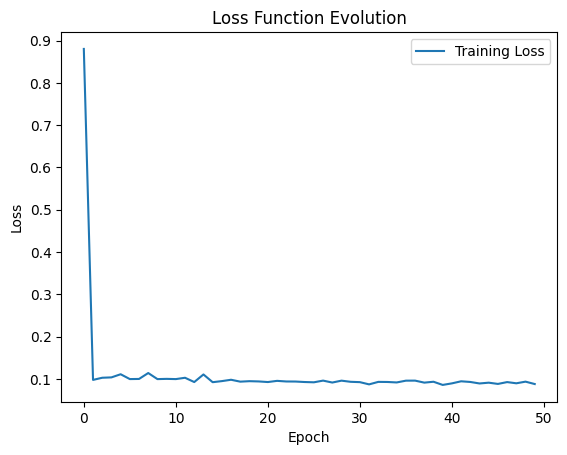

In [73]:
# Plot loss function evolution over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Function Evolution')
plt.legend()
plt.show()

The most of the learning happened at the beginning of the training process. The fact that the loss stabilizes after a few epochs suggests that additional training beyond this point might not lead to significant improvements in the model's performance on the training set. This could also suggest that the model has potentially reached its capacity to learn from the data provided or that the learning rate is too low to make significant changes in the later epochs.

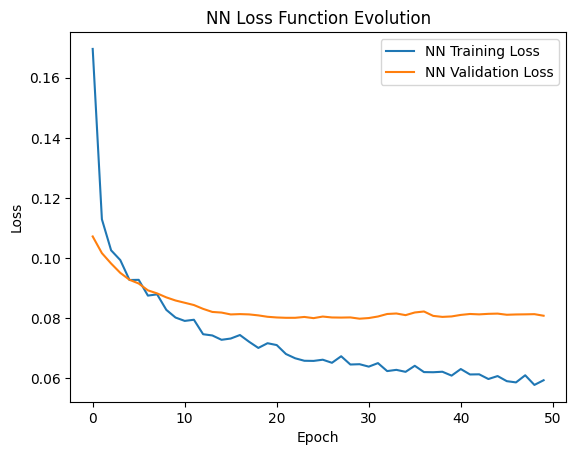

10/10 [==============================] - 0s 1ms/step - loss: 0.0808
Neural Network MSE: 0.08081386983394623


In [74]:
# Get the best parameters for Neural Network

# Train the Neural Network model with the best parameters and monitor validation loss
final_nn_model = create_nn_model(optimizer=best_params['optimizer'], activation=best_params['activation'], neurons=best_params['neurons'], dropout_rate=best_params['dropout_rate'], learning_rate=best_params['learning_rate'])
history_nn = final_nn_model.fit(X_train, y_train, 
                                 validation_data=(X_test, y_test),  ##  Add validation data
                                 epochs=50, 
                                 batch_size=32, 
                                 verbose=0)

# Plot loss function evolution over epochs for both training and validation for Neural Network
plt.plot(history_nn.history['loss'], label='NN Training Loss')
plt.plot(history_nn.history['val_loss'], label='NN Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('NN Loss Function Evolution')
plt.legend()
plt.show()

# Evaluate the Neural Network model
mse_nn = final_nn_model.evaluate(X_test, y_test)
print("Neural Network MSE:", mse_nn)

An example of an overfitted model. The reason: curse of dimensionality, improper hyperparameter search.

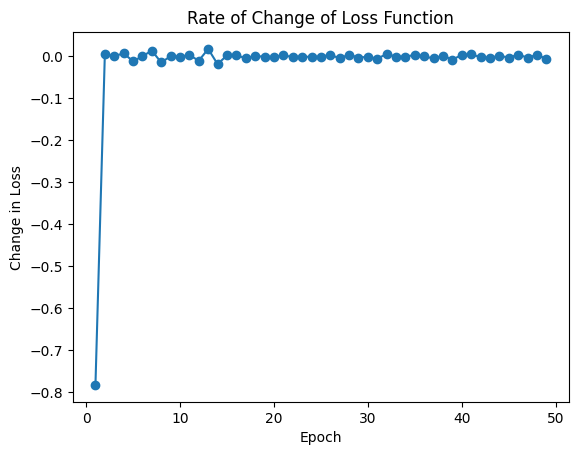

In [75]:
# Extract loss values from the history
loss_values = history.history['loss']

# Compute differences between consecutive loss values
loss_differences = [loss_values[i] - loss_values[i - 1] for i in range(1, len(loss_values))]

# Plot the differences
plt.plot(range(1, len(loss_values)), loss_differences, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Change in Loss')
plt.title('Rate of Change of Loss Function')
plt.show()

Interpretation: at the 6th epoch we have reached the near-maximum precision.

In [76]:
# Ensure the number of features in X_test and X_train are the same
assert X_test.shape[1] == X_train.shape[1]

### Confusion matrix

10/10 [==============================] - 0s 1ms/step


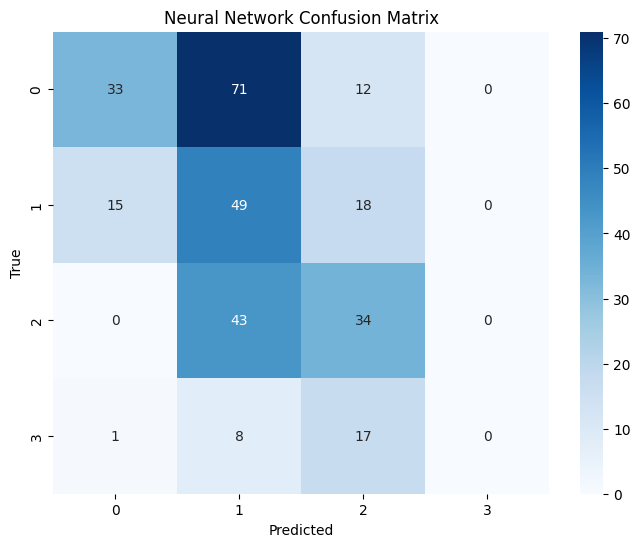

In [77]:
nn_predictions = final_nn_model.predict(X_test)

# The reason is that the model will predict a continous value for the num_awards.
# the resolution is decided precisely by taking the reciprocal of the max num_awards (pre-scaled)
# and if the prediction rounds to this resolution, it is deemed correct, else incorrect.
resolution = 1 / NUM_AWARDS.max()

# rounding predictions to its nearest resolution (de-normalizing)
nn_rounded_predictions = (nn_predictions / resolution).round()

# round the ground truth labels to the nearest resolution (only de-normalizing)
y_test_rounded = (y_test  / resolution).round()

# turn rounded predictions and ground truth values to discrete class labels
nn_predicted_labels = np.clip(nn_rounded_predictions.astype(int), 0, NUM_AWARDS.max())
y_test_labels = np.clip(y_test_rounded.astype(int), 0, NUM_AWARDS.max())


nn_confusion_matrix = confusion_matrix(y_test_labels, nn_predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(nn_confusion_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Neural Network Confusion Matrix')
plt.show()

Key observations:

The model seems to struggle the most with distinguishing between 'Class 0' and 'Class 1', 
as there are a significant number of instances (71) where 'Class 0' was predicted as 'Class 1'.

'Class 2' has been predicted relatively well with the majority being correctly classified (43 correct versus 34 incorrect).

'Class 3' has the least number of instances, and the model has moderate performance with this class.

In [78]:
# Calculate and print the counts of underpredictions, correct predictions, and overpredictions from a confusion matrix
underpredicted_indices = np.triu(nn_confusion_matrix, k=1).sum(axis=1)
correct_indices = np.diag(nn_confusion_matrix)
overpredicted_indices = np.tril(nn_confusion_matrix, k=-1).sum(axis=0)

underpredicted_count = np.sum(underpredicted_indices)
correct_count = np.sum(correct_indices)
overpredicted_count = np.sum(overpredicted_indices)


print("Underpredictions:", underpredicted_count)
print("Correct predictions:", correct_count)
print("Overpredictions:", overpredicted_count)

Underpredictions: 101
Correct predictions: 116
Overpredictions: 84


In [79]:
# Calculate precision
precision = precision_score(y_test_labels, nn_predicted_labels, average='weighted', zero_division=0)

# Calculate recall
recall = recall_score(y_test_labels, nn_predicted_labels, average='weighted', zero_division=0)

print("Precision:", precision)
print("Recall:", recall)

Precision: 0.44498509188473295
Recall: 0.3853820598006645


In [80]:
precision = []
recall = []
f1 = []

# Compute precision, recall, and F1 score for each class
for i in range(NUM_AWARDS.max() + 1):
    y_true = np.where(y_test_labels == i, 1, 0)  # Converting the labels to binary for the current class
    y_pred = np.where(nn_predicted_labels == i, 1, 0)  # Converting the predictions to binary for the current class
    precision_i = precision_score(y_true, y_pred)
    recall_i = recall_score(y_true, y_pred)
    f1_i = f1_score(y_true, y_pred)
    precision.append(precision_i)
    recall.append(recall_i)
    f1.append(f1_i)

# Dataframe for storing my results
metrics_df = pd.DataFrame({
    'Class': range(NUM_AWARDS.max() + 1),
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1
})

# Set the 'Class' column as the index
metrics_df.set_index('Class', inplace=True)

print(metrics_df)

       Precision    Recall  F1 Score
Class                               
0       0.673469  0.284483  0.400000
1       0.286550  0.597561  0.387352
2       0.419753  0.441558  0.430380
3       0.000000  0.000000  0.000000


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


>>## NEURAL NETWORK
>>>### is % 58 in determining if a movie will receive no awards
>>>### and about 60% that it will receive 2 awards!

>>>### has correctly identified 73% of the winners from the test set
>>>>##### however it is not that precise in predicting the exact numbers

Similarly to the RF, NN also correctly predicts the majority

In [94]:
# Get the shape (dimensions) of the training dataset
X_train.shape

(1404, 268)

In [96]:
# SHAP Explainer
explainer = shap.KernelExplainer(final_nn_model.predict,X_train)

# SHAP Values
shap_values = explainer.shap_values(X_test,nsamples=150)

 1/44 [..............................] - ETA: 0s

44/44 [==============================] - 0s 1ms/step


Using 1404 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/301 [00:00<?, ?it/s]

6582/6582 [==============================] - 7s 1ms/step


Regressors in active set degenerate. Dropping a regressor, after 52 iterations, i.e. alpha=1.238e-04, with an active set of 40 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 72 iterations, alpha=7.252e-05, previous alpha=7.061e-05, with an active set of 47 regressors.


6582/6582 [==============================] - 6s 958us/step


NameError: name 'features' is not defined

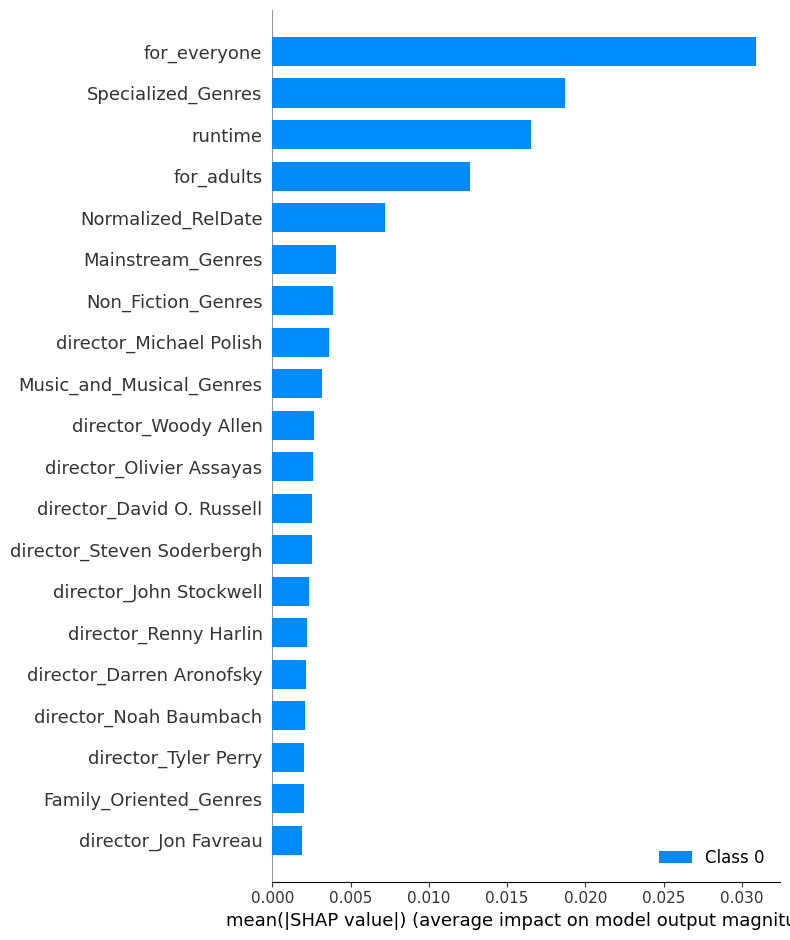

In [97]:
# Visualize SHAP Values
shap.summary_plot(shap_values,X_test,feature_names=feature_columns)

Observations:

1. The feature "for_everyone" has the highest mean SHAP value, indicating it is the most influential when predicting.
2. This is followed by features related to genres, like "Specialized_Genres", "for_adults", "Mainstream_Genres", and "Non_Fiction_Genres", which also have significant impact.
3. The "runtime" and "Normalized_RelDate" are also important features but to a lesser extent compared to the top features.
4. Several directors are listed as individual features (e.g., "director_Michael Polish", "director_Woody Allen"), which suggests that the model places some importance on who directed the film when predicting.
5. The least impactful features listed are "Family_Oriented_Genres" and "director_Jon Favreau".

## What is the best performing supervised ML model?

To determine the best performing supervised machine learning model between Random Forest and Neural Network, we need to consider various metrics such as accuracy, precision, recall, and F1-score.

Given that:

### Random Forest:
- Accuracy for predicting receiving 0 awards: 53%
- Accuracy for predicting receiving 1 award: 24%
- Accuracy for predicting receiving 2 awards: 66%
- Correctly identified 0 awards (recall): 70%
- Correctly identified movies winning 1 award (recall): Approximately 43%

### Neural Network:
- Accuracy for predicting receiving 0 awards: 58%
- Accuracy for predicting receiving 2 awards: 60%
- Correctly identified winners (recall): 73%


Key observations:

- **Random Forest** seems to perform better in terms of precision for predicting receiving 2 awards (66% accuracy) compared to Neural Network (60% accuracy).
- **Neural Network** has a slightly higher accuracy for predicting receiving 0 awards (58%) compared to Random Forest (53%).
- **Neural Network** has a higher recall for correctly identifying winners (73%) compared to Random Forest's recall for correctly identifying receiving 0 awards (70%).

Considering these factors, if the primary concern is correctly identifying successful movies (those receiving awards), the Neural Network might be the better choice due to its higher recall for winners. However, if predicting the exact number of awards is essential, Random Forest might be preferable due to its higher precision for predicting receiving 2 awards.

Ultimately, both Random Forest and Neural Network models can contribute to addressing my research question:

1. **Feature Importance Analysis:** Both models can identify significant features influencing a movie's likelihood of receiving awards. Random Forest offers direct feature importance scores, while Neural Networks can reveal complex relationships in the data.

2. **Prediction Accuracy and Generalization:** Random Forest may generalize well and provide interpretability for feature interactions, while Neural Networks can capture intricate data relationships but might require more data and tuning.

3. **Explainability Analysis:** Techniques like SHAP, are applied to both models. Random Forest may offer easier interpretability, while Neural Networks might uncover more nuanced patterns.

4. **Actionable Insights:** Insights from both models can inform film production and marketing strategies. Random Forest may provide straightforward insights, while Neural Networks could uncover subtle patterns for deeper understanding.

# Unsupervised learning problem

1. Exploratory data analysis and data cleaning of the dataset: you can use similar techniques as those used for the previous dataset.
2. Feature engineering: feature engineering based on the EDA step.
3. Dimensionality reduction: Implement dimensionality reduction with PCA.
4. Clustering: Perform K-means clustering on the results of the PCA step and find the optimal parameter k using e.g., the elbow method for a set of k values and a chosen goodness of fit metric.
5. Cluster interpretation: After you have found the optimal clustering model, investigate the resulting clusters by plotting the original features for each cluster and draw conclusions on what those clusters represent. Use the clusters’ interpretation to answer your business question.
6. Bonus: compare the k-mean clustering with the (H)-DBSCAN method and identify which performs better for your business question.

### ! The same EDA and and Feature Engineering used for the supervised problem is used for the unsupervised learning problem

In [61]:
len(X.columns)

268

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2006 entries, 7 to 11357
Columns: 276 entries, url to Normalized_RelDate
dtypes: float64(9), int32(2), int64(260), object(5)
memory usage: 4.2+ MB


Explained variance ratio: 0.2410672216235682
Explained variance ratio: 0.28821129319809935
Explained variance ratio: 0.3324004213012377
Explained variance ratio: 0.35502629369876954
Explained variance ratio: 0.3732300335953993
Explained variance ratio: 0.38970623655976944
Explained variance ratio: 0.40508798566365534
Explained variance ratio: 0.4180244388592937
Explained variance ratio: 0.42838742914613237
Explained variance ratio: 0.43740328826054226
Explained variance ratio: 0.4436083415174711
Explained variance ratio: 0.4494264220310006
Explained variance ratio: 0.45502585329796336
Explained variance ratio: 0.4601026652544094
Explained variance ratio: 0.46514258057756686
Explained variance ratio: 0.4698726726938155
Explained variance ratio: 0.4745218522481099
Explained variance ratio: 0.479132896736783
Explained variance ratio: 0.4835897542612299
Explained variance ratio: 0.48764011599784424
Explained variance ratio: 0.4916398986445346
Explained variance ratio: 0.49550380696470026
E

Explained variance ratio: 0.5099735307760069
Explained variance ratio: 0.511687231507386
Explained variance ratio: 0.5146001689025529
Explained variance ratio: 0.5175395680490525
Explained variance ratio: 0.5207213349929544
Explained variance ratio: 0.5236749199652242
Explained variance ratio: 0.5265900062660348
Explained variance ratio: 0.5293226098331708
Explained variance ratio: 0.5322668384899821
Explained variance ratio: 0.5350847055758547
Explained variance ratio: 0.5378122273479429
Explained variance ratio: 0.5410278819257232
Explained variance ratio: 0.5436484229884386
Explained variance ratio: 0.54627435164357
Explained variance ratio: 0.5492493574711805
Explained variance ratio: 0.5515387846369798
Explained variance ratio: 0.5543559125480149
Explained variance ratio: 0.557033876973563
Explained variance ratio: 0.559634785341372
Explained variance ratio: 0.5626331010227114
Explained variance ratio: 0.5648472285848505
Explained variance ratio: 0.5676290538034158
Explained varia

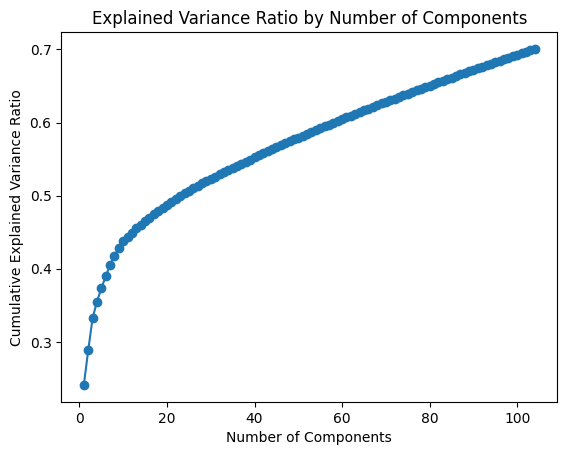

104


In [63]:
explained_variance_ratio = []
variable = 1

while sum(explained_variance_ratio) < 0.7:
    # PCA instanciation with the desired number of components
    pca = PCA(n_components=variable)

    # PCA fitting to the data and transforming the features
    X_pca = pca.fit_transform(X)

    # Checking the explained variance ratio to understand how much variance is explained by each principal component
    explained_variance_ratio = pca.explained_variance_ratio_
    print("Explained variance ratio:", sum(explained_variance_ratio))
    variable += 1

# Cumulative explained variance to decide the number of components plottinh
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio.cumsum(), marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Explained Variance Ratio by Number of Components')
plt.show()

print(len(explained_variance_ratio))

# Now X_pca contains the transformed features with reduced dimensionality

This dimension reduction reduces our original dataset from having 268 columns to only 104, making it a marginally less complex hyperspace to navigate.

However we could also use the elbow method to find the point of diminishing returns. Using this method we find that using 20 dimensions we can explain half of the variance in the data already.

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp

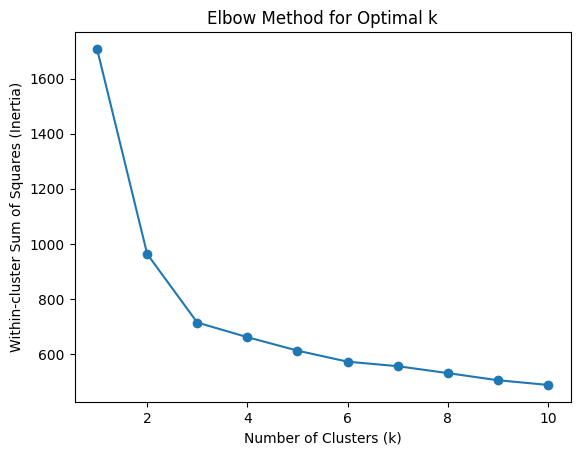

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


KMeans(n_clusters=3, random_state=10)

In [64]:
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X)

# The optimal number of clusters (k) using the elbow method
inertia = []
k_values = range(1, 11)  # Try different values of k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=10)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (Inertia)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Perform K-means clustering with the optimal number of clusters
optimal_k = 3  # Choose the optimal k based on the elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=10)
kmeans.fit(X_pca)



According to this plot, the optimal number of clusters for the data set being analyzed would likely be 3, as this is the point after which the marginal gain in performance diminishes.

In [65]:
X_pca[1]

array([-0.69494913, -0.33743762, -0.06247896, -0.20613098, -0.01148279,
        0.00646401,  0.04146312, -0.00987745,  0.02442177,  0.00436341,
       -0.01838814,  0.01276122, -0.01949524, -0.01051899, -0.01227256,
       -0.01257465,  0.02246133,  0.00073978, -0.00459284,  0.01621189])

In [66]:
kmeans.labels_

array([0, 1, 1, ..., 1, 1, 2])

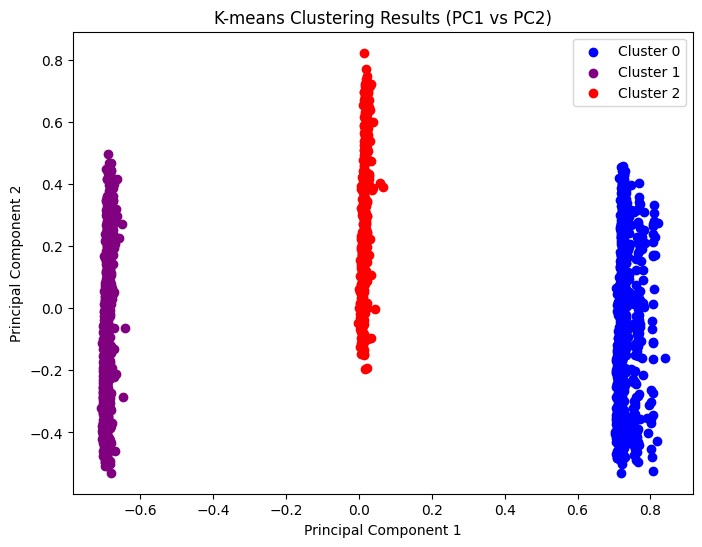

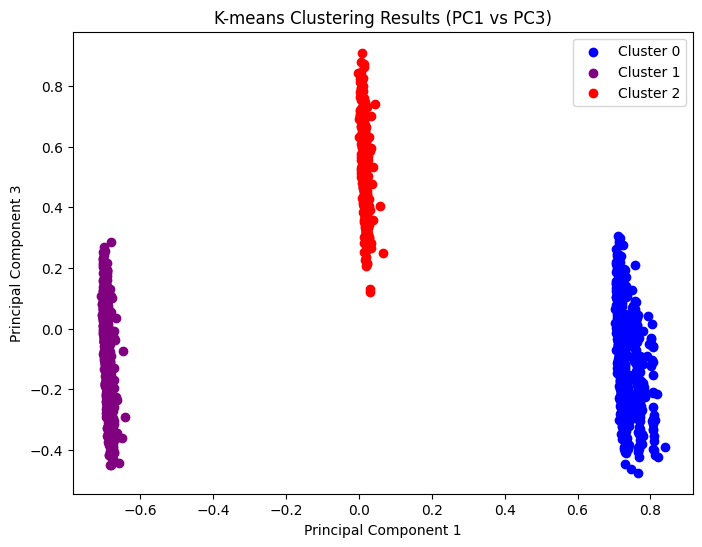

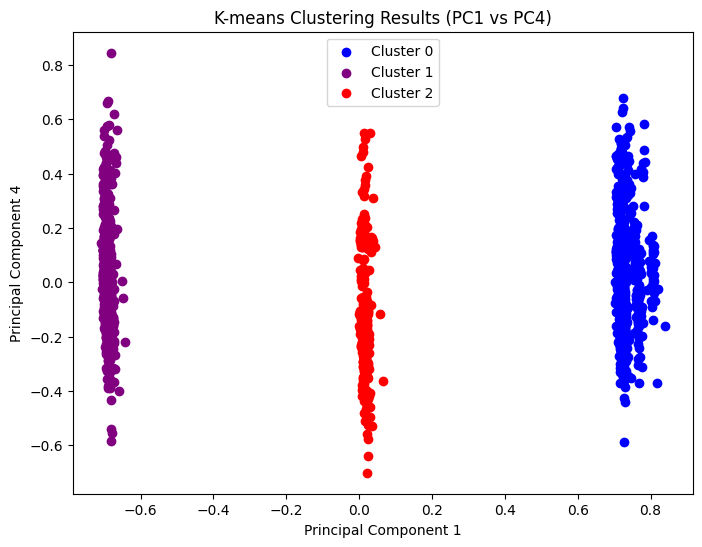

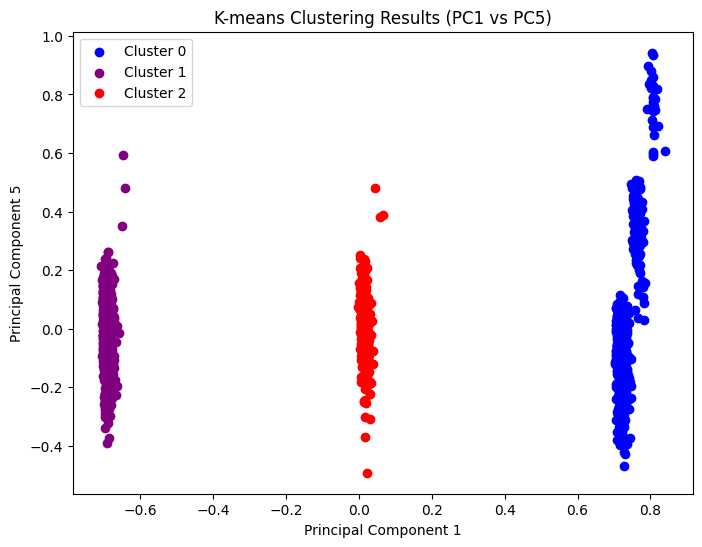

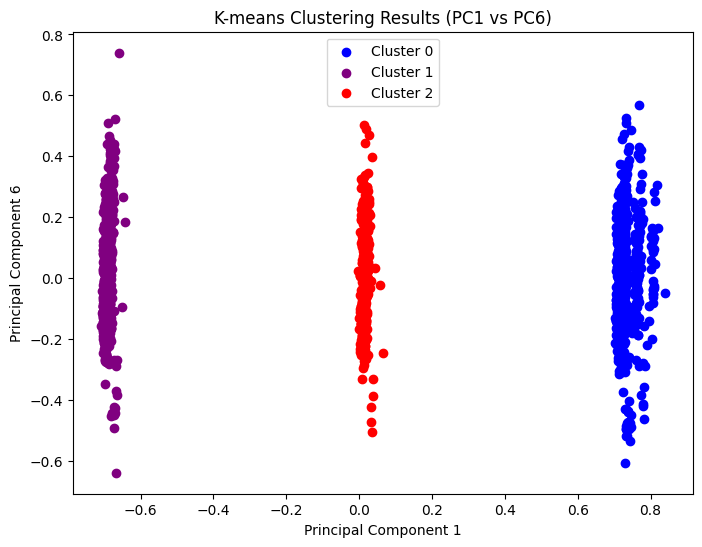

...

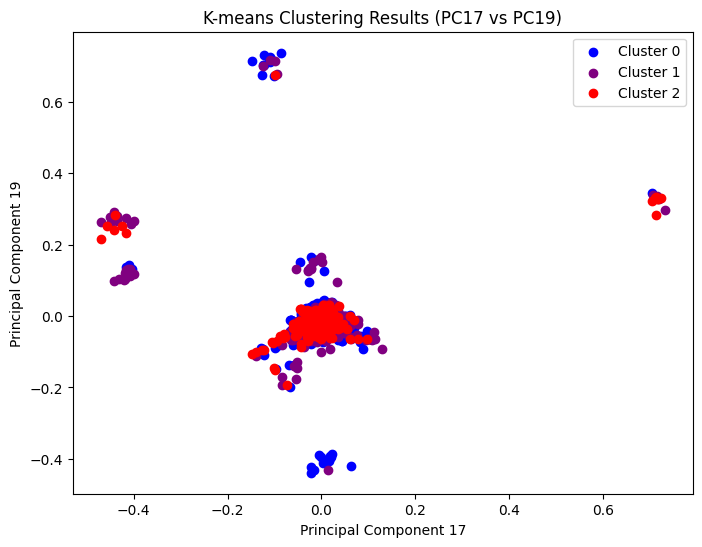

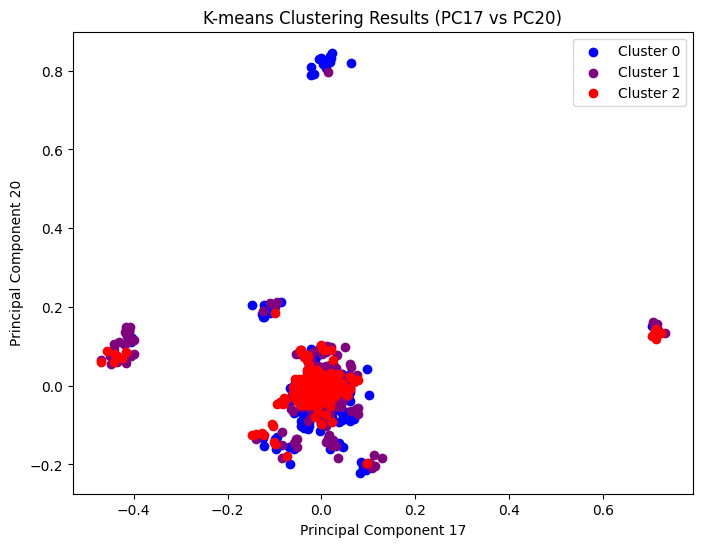

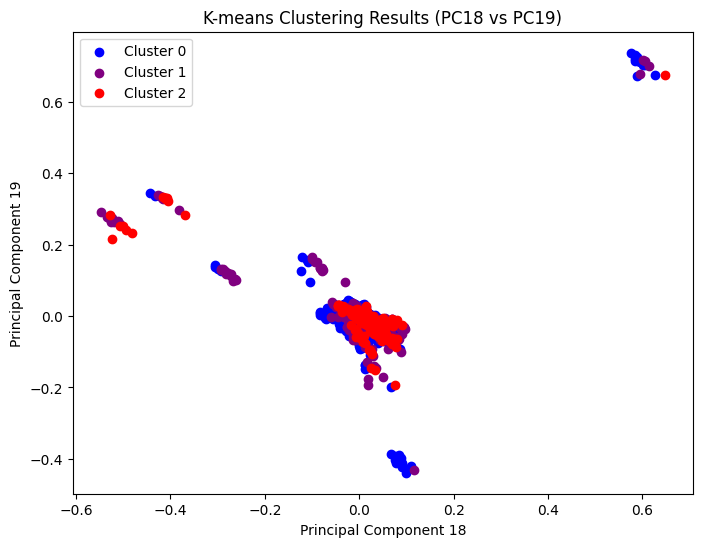

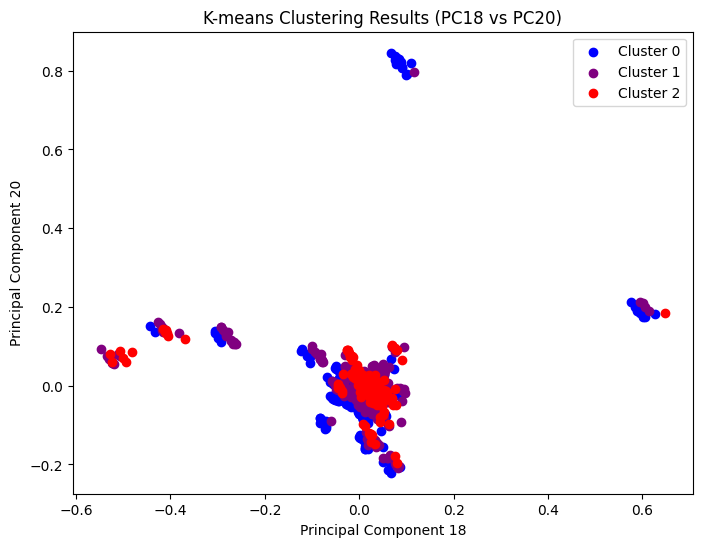

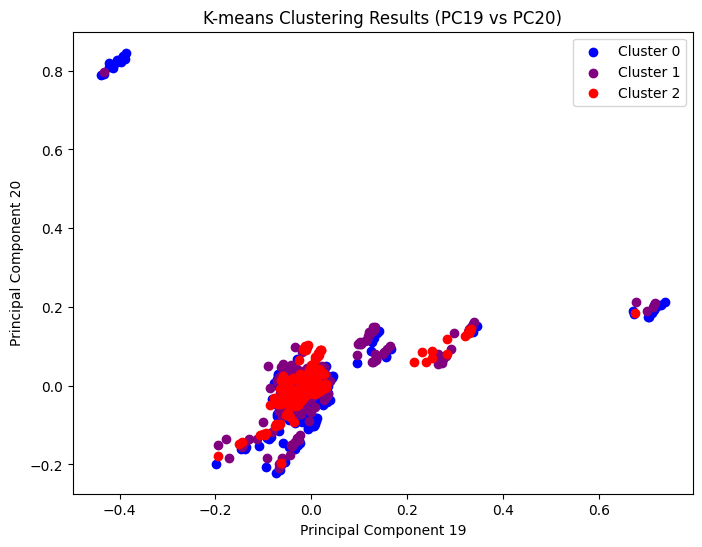

In [67]:
labels = kmeans.labels_

colors = ['blue', 'purple', 'red']

##  plot clusters for all combinations of principal components
for i in range(X_pca.shape[1]):
    for j in range(i+1, X_pca.shape[1]):
        plt.figure(figsize=(8, 6))
        for label in range(optimal_k):
            plt.scatter(X_pca[labels == label, i], X_pca[labels == label, j], label=f'Cluster {label}', c=colors[label])
        plt.xlabel(f'Principal Component {i+1}')
        plt.ylabel(f'Principal Component {j+1}')
        plt.title(f'K-means Clustering Results (PC{i+1} vs PC{j+1})')
        plt.legend()
        plt.show()

Some interpretations, for instance:

It appears that principal component 3 decides if a movie receives {0,1} or {2} awards, as the more a movie has in this principal component, the more likely it is to receive 2 awards.
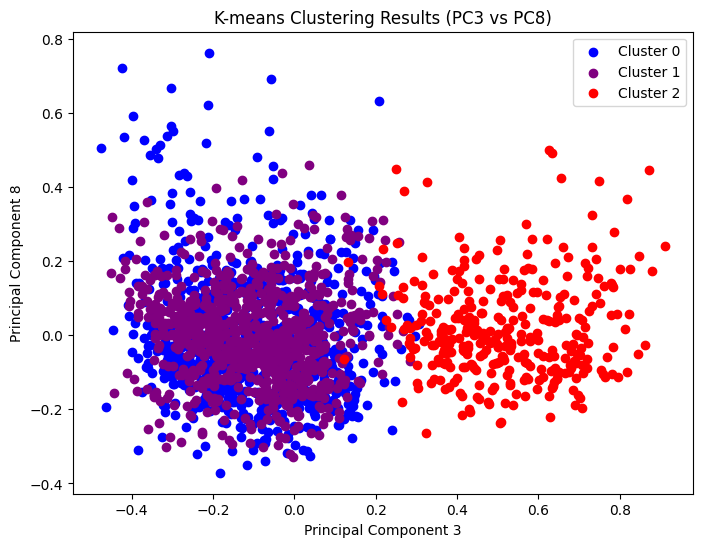

The more a movie is principal component 2 AND principal component 3, the more likely it is to receive 2 awards.

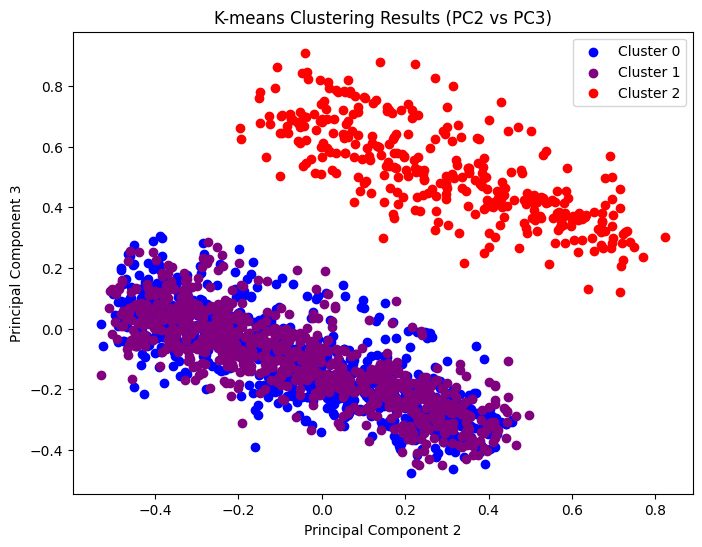

It appears there are no movies that are very principal component 2 AND principal component 5 at the same time.

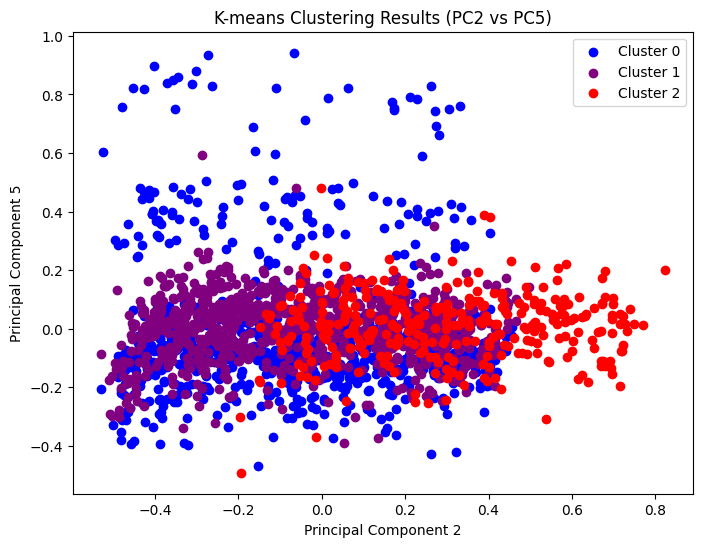

In [68]:
print(list(kmeans.labels_))

[0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 2, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 2, 2, 1, 0, 1, 1, 1, 0, 0, 2, 1, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 2, 0, 0, 2, 2, 1, 1, 0, 0, 2, 1, 2, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 2, 1, 0, 0, 0, 0, 1, 1, 2, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 2, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 2, 1, 0, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 1, 1, 1, 2, 0, 1, 1, 0, 1, 0, 1, 1, 2, 2, 1, 1, 0, 1, 2, 0, 2, 0, 2, 1, 2, 0, 1, 0, 0, 1, 0, 1, 1, 1, 2, 0, 1, 1, 0, 2, 1, 1, 2, 0, 1, 1, 0, 2, 0, 0, 0, 0, 0, 1, 2, 2, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 2, 0, 2, 1, 0, 1, 1, 1, 2, 2, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 2, 2, 2, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 0, 2, 1, 1, 2, 2, 0, 1, 2, 1, 1, 1, 2, 1, 0, 2, 1, 1, 2, 0, 1, 0, 1, 1, 2, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 

Let's evaluate the quality of my clustering results using silhouette score, Davies-Bouldin index, and Calinski-Harabasz index.

In [70]:
# Calculate silhouette score
silhouette = silhouette_score(X_pca, kmeans.labels_)

# Calculate Davies-Bouldin index
davies_bouldin = davies_bouldin_score(X_pca, kmeans.labels_)

# Calculate Calinski-Harabasz index
calinski_harabasz = calinski_harabasz_score(X_pca, kmeans.labels_)

print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)

Silhouette Score: 0.4125148100844057
Davies-Bouldin Index: 1.048702845961655
Calinski-Harabasz Index: 1392.7731536412728


The silhouette score of approximately 0.41 indicates that the clustering is somewhat strong, but the value is closer to 0 than to 1. It suggests that though distinct clusters did emerge, there is overlap between clusters and that the clusters are not well-separated.

The Davies-Bouldin index of approximately 1.04 suggests that the clustering has some degree of separation, as the value is relatively low but it would be even better if the value closed in on 0 more, which is indicating that there is room for improvement in the cluster separation.

The Calinski-Harabasz index of approximately 1400 indicates a moderate level of clustering density and separation.

In [71]:
# Step 1: Retrieve loadings from the PCA object
loadings = pca.components_

# Shape of the loadings matrix
num_components = loadings.shape[0]

top_features_with_weights = {}

for i in range(num_components):
    component_loadings = loadings[i]
    # indices of top features based on absolute weight (most significant either neg or pos)
    top_feature_indices = np.argsort(np.abs(component_loadings))[::-1][:5]  # Top 5 features
    # map feature indices to feature names and weights
    top_feature_names_with_weights = [(feature_columns[idx], component_loadings[idx]) for idx in top_feature_indices]
    top_features_with_weights[f'Principal Component {i+1}'] = top_feature_names_with_weights

# Dispalying top features with their weights for each principal component
for component, features_with_weights in top_features_with_weights.items():
    print(f"{component}:")
    for feature, weight in features_with_weights:
        print(f"{weight:.3f} - {feature}")
    print()


Principal Component 1:
-0.706 - for_adults
0.700 - for_everyone
0.082 - Family_Oriented_Genres
0.021 - Miscellaneous_Genres
0.020 - Specialized_Genres

Principal Component 2:
-0.880 - Normalized_RelDate
-0.300 - for_everyone
-0.290 - for_adults
-0.147 - runtime
-0.078 - Mainstream_Genres

Principal Component 3:
-0.576 - for_adults
-0.551 - for_everyone
0.423 - Normalized_RelDate
-0.288 - Mainstream_Genres
0.225 - Non_Fiction_Genres

Principal Component 4:
-0.553 - Mainstream_Genres
0.471 - Non_Fiction_Genres
-0.410 - Specialized_Genres
0.268 - for_everyone
0.265 - Miscellaneous_Genres

Principal Component 5:
0.728 - Family_Oriented_Genres
-0.472 - runtime
-0.267 - Non_Fiction_Genres
-0.262 - Mainstream_Genres
0.163 - Specialized_Genres

Principal Component 6:
0.643 - Specialized_Genres
-0.376 - Miscellaneous_Genres
0.357 - Non_Fiction_Genres
-0.354 - Mainstream_Genres
0.311 - runtime

Principal Component 7:
0.843 - Miscellaneous_Genres
0.316 - Specialized_Genres
0.304 - runtime
0.187 -

In [72]:
loadings = pca.components_

# The loadings for each principal component
for i, component in enumerate(loadings):
    print(f"Principal Component {i+1} Loadings:")
    for j, feature in enumerate(sorted(feature_columns)):
        print(f"{feature}: {component[j]}")
        if j == 5:
            break
    print()


Principal Component 1 Loadings:
Family_Oriented_Genres: 0.007054194263929221
Mainstream_Genres: 0.7000551874033586
Miscellaneous_Genres: -0.7059635212616064
Music_and_Musical_Genres: 9.313831581817741e-06
Non_Fiction_Genres: 0.0061842574551399495
Normalized_RelDate: 0.0201544254225111

Principal Component 2 Loadings:
Family_Oriented_Genres: -0.1470575616551557
Mainstream_Genres: -0.3000313331880552
Miscellaneous_Genres: -0.2897654009598483
Music_and_Musical_Genres: 0.0010315654636219374
Non_Fiction_Genres: -0.07801263572592712
Normalized_RelDate: -0.07166816863051514

Principal Component 3 Loadings:
Family_Oriented_Genres: -0.02852803098663354
Mainstream_Genres: -0.5512224656142823
Miscellaneous_Genres: -0.5755913310013002
Music_and_Musical_Genres: 0.004038971053034502
Non_Fiction_Genres: -0.28767737663725856
Normalized_RelDate: -0.13555489022392136

Principal Component 4 Loadings:
Family_Oriented_Genres: -0.16110467166778658
Mainstream_Genres: 0.26821461692418636
Miscellaneous_Genres:

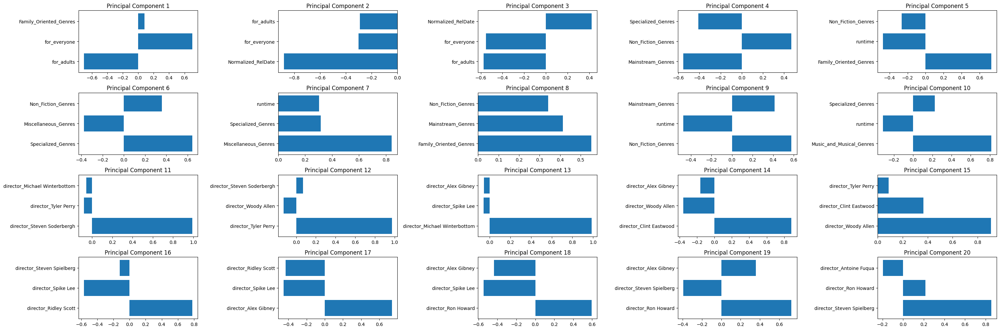

In [73]:
# Specify the number of top features to plot for each principal component.
top_n = 3

# Create a bar plot for each individual principal component
num_components = loadings.shape[0]

plt.figure(figsize=(30, 10))

for i in range(num_components):
    ##  the features based on their absolute loading values, sorted
    sorted_indices = np.argsort(np.abs(loadings[i]))[::-1][:top_n]
    top_features = [feature_columns[idx] for idx in sorted_indices]
    top_loadings = loadings[i, sorted_indices]
    
    plt.subplot(4, 5, i+1)
    plt.barh(range(len(top_features)), top_loadings, align='center')
    plt.yticks(range(len(top_features)), top_features)
    plt.title(f"Principal Component {i+1}")

plt.tight_layout()
plt.show()

The plot above visualizes the loadings (also known as feature weights) of various features for different principal components (PCs) obtained from my PCA analysis. These bar charts help in understanding which features are most influential for each principal component. Here's a summary of how to interpret these plots:

- For each principal component, the length of the bar represents the magnitude of the loading for each feature. A longer bar means the feature has a stronger influence on that principal component.
- The direction of the bar (left or right from the zero point) indicates the sign of the loading. A bar extending to the right suggests a positive loading, while a bar to the left suggests a negative loading.
- Positive loadings indicate that the feature and the principal component increase together, while negative loadings indicate an inverse relationship.

For instance:
- **Principal Components 1 and 2**: Features like 'for_adults', 'for_everyone', and 'Normalized_RelDate' have significant loadings, suggesting these features strongly influence the variability captured by these components.
- **Principal Components 6, 7, and 10**: Genres such as 'Non_Fiction_Genres', 'Specialized_Genres', and 'Music_and_Musical_Genres' appear to be influential, which could suggest these genres play a key role in the variation these components are capturing.
- **Principal Components 11, 12, and 16-20**: Individual directors' names appear with significant loadings, indicating that certain directors have unique styles or characteristics that differentiate movies in the dataset along these dimensions.

The following code is meant to illustrate the "significance" of a single feature in the clustering model. This significance is the sum of the absolute weight of each feature in every principal component of the model.

In [74]:
# Sum of all loadings for each feature across principal components
sum_loadings = np.sum(np.abs(loadings), axis=0)

feature_importance = pd.DataFrame({'Feature': feature_columns, 'Sum Loadings': sum_loadings})

feature_importance_sorted = feature_importance.sort_values(by='Sum Loadings', ascending=False)

feature_importance_sorted

,Feature,Sum Loadings
0,runtime,2.897071
4,Mainstream_Genres,2.730684
5,Specialized_Genres,2.716157
6,Non_Fiction_Genres,2.647030
262,director_Spike Lee,2.585292
...,...,...
10,director_Tate Taylor,0.056914
15,director_Andrew Niccol,0.056503
36,director_Robert Pulcini,0.055449
73,director_Neil Jordan,0.050827


Unsupervised learning, conclusion:

1. **Cluster Characteristics**: The k-means clustering appears to have identified distinct groups within my data, as evidenced by the silhouette score, Davies-Bouldin index, and Calinski-Harabasz index. These groups likely represent underlying patterns or similarities among the data points, although there is room for improvement in terms of cluster separation and cohesion.

2. **Principal Component Analysis**: PCA has revealed that certain features significantly contribute to the variation in my dataset. Features related to the target audience ('for_adults', 'for_everyone'), release date ('Normalized_RelDate'), genres, and specific directors play major roles in differentiating the data.

3. **Influence of Genres and Directors**: Different genres and the works of specific directors are important features that contribute to the clustering structure. This suggests that the clusters might represent groups of movies with similar genres or styles associated with particular directors.

4. **Target Audience Significance**: The significance of features related to the target audience (movie rarings) in the first principal component suggests that the primary variance within my dataset may be heavily influenced by the intended audience of the content, which is a valuable insight for content strategy.


# Overall conclusion

Given the comprehensive research and analysis conducted using both supervised and unsupervised learning methods, the following overarching conclusion can be drawn to answer my research questions:

**Supervised Learning Analysis:**
Through the application of Random Forest and Neural Network models, the research has shed light on key features that impact a movie's likelihood of receiving awards. While the Random Forest model excels in precision for predicting a specific number of awards, the Neural Network model demonstrates a higher recall for identifying award-winning movies. The best-performing model depends on the specific goals of the analysis—whether it is the accurate prediction of award counts or the identification of potential winners. Explaining the model's predictions using SHAP values or other explainability tools reveals that factors such as genre, and release date are significant predictors of award likelihood. These insights are vital for a movie studio to refine its production and marketing strategies, aiming to enhance the movie's chances of award reception and, consequently, its financial success and reputation.

**Unsupervised Learning Analysis:**
The k-means clustering, evaluated using silhouette score, Davies-Bouldin index, and Calinski-Harabasz index, identified distinct clusters within the dataset that correlate with audience preferences and potential award reception. The PCA analysis indicates that the differentiation in the movie dataset is primarily influenced by the target audience demographics (movie rating), movie release timing, and specific genres. Clusters seem to suggest patterns that align with movies receiving awards, especially when considering the influence of the directors' styles. These findings can help movie studios to better understand their audience segments and tailor their marketing strategies. Moreover, the clustering model has the potential to reveal emerging trends that could inform genre choices or directorial decisions for future productions, aligning with the goals of achieving awards and enhancing the studio's success.

**Overall Conclusion:**
By integrating the insights from both supervised and unsupervised learning models, a movie studio can gain a holistic understanding of the multifaceted nature of film success. The supervised models suggest that focusing on features that are strongly predictive of award wins can guide content creation towards more award-winning potential. Meanwhile, unsupervised learning reveals that understanding audience segments and preferences is key to effective marketing and trend identification. When combined, these data-driven insights enable a strategic approach to film production and marketing that is aligned with industry recognition and financial achievement. The study underscores the transformative power of machine learning in the movie industry, providing a roadmap for leveraging advanced analytics to inform decision-making processes that contribute to a movie's success and the studio's legacy.

**Recommendation:**

To answer my main research questions for both:

Research Question Supervised Learning:
"How can a movie studio utilize the power of data-driven insights, using Supervised Learning (Random Forest and Neural Network) models, to refine its film production and marketing strategies, ultimately maximizing the likelihood of a movie receiving awards and thereby elevating its financial success, industry recognition, and reputation?"

AND

Research Question Unsupervised Learning:
"How can a movie studio leverage unsupervised clustering models to better understand audience preferences, optimize marketing strategies, and identify potential trends that increase the likelihood of a movie receiving awards and thereby elevating its financial success, industry recognition, and reputation?"



I believe that one model cannot be highlighted as the best performing, as they all have their advantages and disadvantages, therefore, by adopting a multi-model approach, the studio can harness the predictive power of neural networks, the interpretability of random forests, and the exploratory analysis capabilities of clustering. This holistic strategy can enable the studio to produce content that is both critically acclaimed and commercially successful, target marketing efforts more effectively, and make informed decisions to stay ahead in the competitive landscape of the film industry.

For instance:
For **predictive accuracy and identifying award-winning potential**, the **Neural Network** model appears to be more suitable due to its higher recall for correctly identifying winners. This means it is better at catching true positives, which is crucial if the goal is to minimize the chance of overlooking a potentially successful movie.

When it comes to understanding **which features are the most significant predictors of award reception**, a **Random Forest** model offers direct and interpretable feature importance scores, making it easier to pinpoint the exact features that contribute to the success of a movie. This can be very useful for making informed decisions about which types of films to produce.

To gain a deep understanding of the **market and audience preferences**, and to **segment the audience or content effectively**, unsupervised learning methods such as **k-means clustering** are invaluable. The clusters formed can guide marketing strategies by highlighting audience segments and their preferences.